<a href="https://colab.research.google.com/github/rendihardi/OlahData-AspectBased-SentimentAnalysis/blob/main/EDA_Klasifikasi_Interpretasi.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Preprocessing**

In [1]:
import pandas as pd
import numpy as np

df = pd.read_csv('/content/Wondr- Dataset.csv')
df


,content,sentimen,aspek
0,LEBIH simpel BNI MOBILE. MAKSUDNYA APA YAH nas...,Negative,Tampilan
1,Lebih simpel dari aplikasi BNI sebelumnya,Positive,Tampilan
2,"Wah, notifikasi terkait konfirmasi transaksi l...",Positive,Tampilan
3,"Lebih simpel fiturÂ² nya, tapi belum ada fitur...",Positive,Tampilan
4,Keren Sih tapi gak ada bonus nya,Positive,Tampilan
...,...,...,...
12433,Transaksi sat set ga pake lama love love wondr...,Positive,Transaksi
12434,Lebih simple dan praktis digunakan serta punya...,Positive,Transaksi
12435,Error terus mau transfer padahal belum mencapa...,Negative,Transaksi
12436,Kalo bayar bayar sekarang pake wondr jadi mudah,Positive,Transaksi


In [ ]:
import re
import pandas as pd

def clean_text(df, content, content_clean):
    # Menghapus emotikon dan karakter non-ASCII
    df[content_clean] = df[content].fillna('').apply(
        lambda elem: re.sub(r'[^\x00-\x7F]+', '', str(elem))
    )

    # Memisahkan kata yang terhubung oleh tanda baca
    df[content_clean] = df[content_clean].apply(
        lambda elem: re.sub(r'([a-zA-Z0-9])[\.\,\-;:\!]+([a-zA-Z])', r'\1 \2', elem)
    )

    # Menghapus karakter, simbol, angka, dan tanda baca lainnya
    df[content_clean] = df[content_clean].apply(
        lambda elem: re.sub(r'[^a-zA-Z\s]', '', str(elem))
    )

    return df

# Ganti 'content' dengan nama kolom teks Anda di DataFrame
df = clean_text(df, 'content', 'content_clean')
# Menampilkan hasil 10 baris pertama
df[['content', 'content_clean']]


,content,content_clean
0,LEBIH simpel BNI MOBILE. MAKSUDNYA APA YAH nas...,LEBIH simpel BNI MOBILE MAKSUDNYA APA YAH nasa...
1,Lebih simpel dari aplikasi BNI sebelumnya,Lebih simpel dari aplikasi BNI sebelumnya
2,"Wah, notifikasi terkait konfirmasi transaksi l...",Wah notifikasi terkait konfirmasi transaksi la...
3,"Lebih simpel fiturÂ² nya, tapi belum ada fitur...",Lebih simpel fitur nya tapi belum ada fitur ta...
4,Keren Sih tapi gak ada bonus nya,Keren Sih tapi gak ada bonus nya
...,...,...
12433,Transaksi sat set ga pake lama love love wondr...,Transaksi sat set ga pake lama love love wondr
12434,Lebih simple dan praktis digunakan serta punya...,Lebih simple dan praktis digunakan serta punya...
12435,Error terus mau transfer padahal belum mencapa...,Error terus mau transfer padahal belum mencapa...
12436,Kalo bayar bayar sekarang pake wondr jadi mudah,Kalo bayar bayar sekarang pake wondr jadi mudah


In [ ]:
# Melakukan case folding pada kolom 'content'
df['content_casefolded'] = df['content_clean'].str.lower()

# Menampilkan 10 baris pertama dari data dengan kolom hasil case folding
df[['content_clean', 'content_casefolded']]


,content_clean,content_casefolded
0,LEBIH simpel BNI MOBILE MAKSUDNYA APA YAH nasa...,lebih simpel bni mobile maksudnya apa yah nasa...
1,Lebih simpel dari aplikasi BNI sebelumnya,lebih simpel dari aplikasi bni sebelumnya
2,Wah notifikasi terkait konfirmasi transaksi la...,wah notifikasi terkait konfirmasi transaksi la...
3,Lebih simpel fitur nya tapi belum ada fitur ta...,lebih simpel fitur nya tapi belum ada fitur ta...
4,Keren Sih tapi gak ada bonus nya,keren sih tapi gak ada bonus nya
...,...,...
12433,Transaksi sat set ga pake lama love love wondr,transaksi sat set ga pake lama love love wondr
12434,Lebih simple dan praktis digunakan serta punya...,lebih simple dan praktis digunakan serta punya...
12435,Error terus mau transfer padahal belum mencapa...,error terus mau transfer padahal belum mencapa...
12436,Kalo bayar bayar sekarang pake wondr jadi mudah,kalo bayar bayar sekarang pake wondr jadi mudah


In [ ]:
import pandas as pd

# Membaca file kamus kata baku
kamus_baku = pd.read_excel('/content/kamuskatabaku.xlsx')
baku_dict = dict(zip(kamus_baku['tidak_baku'], kamus_baku['kata_baku']))
kata_baru_df = pd.read_csv('/content/normalisasinew - Sheet1.csv')

# Pastikan CSV memiliki dua kolom: 'tidak_baku' dan 'kata_baku'
kata_baru_dict = dict(zip(kata_baru_df['tidak_baku'], kata_baru_df['kata_baku']))
baku_dict.update(kata_baru_dict)

# Fungsi untuk normalisasi teks menggunakan kamus alay
def normalisasi_teks(teks):
    kata_kata = teks.split()  # Memisahkan teks menjadi kata-kata
    kata_kata_normal = [baku_dict.get(kata, kata) for kata in kata_kata]  # Gantikan kata sesuai kamus
    return ' '.join(kata_kata_normal)

# Contoh penggunaan pada dataframe ulasan
df['content_normalized'] = df['content_casefolded'].apply(normalisasi_teks)
df[['content_casefolded', 'content_normalized']]


,content_casefolded,content_normalized
0,lebih simpel bni mobile maksudnya apa yah nasa...,lebih simpel bni mobile maksudnya apa ya nasab...
1,lebih simpel dari aplikasi bni sebelumnya,lebih simpel dari aplikasi bni sebelumnya
2,wah notifikasi terkait konfirmasi transaksi la...,wah notifikasi terkait konfirmasi transaksi la...
3,lebih simpel fitur nya tapi belum ada fitur ta...,lebih simpel fitur ya tapi belum ada fitur tar...
4,keren sih tapi gak ada bonus nya,keren sih tapi tidak ada bonus ya
...,...,...
12433,transaksi sat set ga pake lama love love wondr,transaksi sat set tidak pakai lama love love w...
12434,lebih simple dan praktis digunakan serta punya...,lebih simpel dan praktis digunakan serta punya...
12435,error terus mau transfer padahal belum mencapa...,error terus mau transfer padahal belum mencapa...
12436,kalo bayar bayar sekarang pake wondr jadi mudah,kalau bayar bayar sekarang pakai wondr jadi mudah


In [ ]:
import nltk.corpus
nltk.download('stopwords')
from nltk.corpus import stopwords

# Mendapatkan daftar stopwords dalam bahasa Indonesia
stop = stopwords.words('indonesian')
# Daftar kata yang ingin dipertahankan
words_to_keep = ['kurang', 'tidak', 'masih', 'belum', 'baik', 'sangat','lama','sering','tanpa','enggak','lebih','bisa']
# Daftar kata tambahan yang ingin dihapus (contoh kata dari Dicoding atau kata lain)
words_to_remove = ['nya','ya','by','aplikasi','aplikasinya','wondr','bni']
for word in words_to_keep:
    if word in stop:  # Pastikan kata tersebut ada dalam stopwords
        stop.remove(word)
stop.extend(words_to_remove)
# Mengaplikasikan stopword removal sambil mempertahankan kata "kurang"
df['content_stopword'] = df['content_normalized'].apply(
    lambda x: ' '.join([word for word in x.split() if word not in stop])
)
# Menampilkan 10 baris pertama dari kolom 'content_normalized' dan 'content_stopword'
df[['content_normalized', 'content_stopword']]

[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!


,content_normalized,content_stopword
0,lebih simpel bni mobile maksudnya apa ya nasab...,lebih simpel mobile maksudnya nasabah suruh mi...
1,lebih simpel dari aplikasi bni sebelumnya,lebih simpel
2,wah notifikasi terkait konfirmasi transaksi la...,notifikasi terkait konfirmasi transaksi lama k...
3,lebih simpel fitur ya tapi belum ada fitur tar...,lebih simpel fitur belum fitur tarik tunai lan...
4,keren sih tapi tidak ada bonus ya,keren sih tidak bonus
...,...,...
12433,transaksi sat set tidak pakai lama love love w...,transaksi sat set tidak pakai lama love love
12434,lebih simpel dan praktis digunakan serta punya...,lebih simpel praktis fitur transaksi keuangan ...
12435,error terus mau transfer padahal belum mencapa...,error transfer belum mencapai limit transfer j...
12436,kalau bayar bayar sekarang pakai wondr jadi mudah,bayar bayar pakai mudah


In [ ]:
import nltk
nltk.download('punkt_tab')
from nltk.tokenize import sent_tokenize, word_tokenize

df['content_tokens'] = df['content_stopword'].apply(lambda x: word_tokenize(x))
df[['content_stopword', 'content_tokens']]


[nltk_data] Downloading package punkt_tab to /root/nltk_data...
[nltk_data]   Package punkt_tab is already up-to-date!


,content_stopword,content_tokens
0,lebih simpel mobile maksudnya nasabah suruh mi...,"[lebih, simpel, mobile, maksudnya, nasabah, su..."
1,lebih simpel,"[lebih, simpel]"
2,notifikasi terkait konfirmasi transaksi lama k...,"[notifikasi, terkait, konfirmasi, transaksi, l..."
3,lebih simpel fitur belum fitur tarik tunai lan...,"[lebih, simpel, fitur, belum, fitur, tarik, tu..."
4,keren sih tidak bonus,"[keren, sih, tidak, bonus]"
...,...,...
12433,transaksi sat set tidak pakai lama love love,"[transaksi, sat, set, tidak, pakai, lama, love..."
12434,lebih simpel praktis fitur transaksi keuangan ...,"[lebih, simpel, praktis, fitur, transaksi, keu..."
12435,error transfer belum mencapai limit transfer j...,"[error, transfer, belum, mencapai, limit, tran..."
12436,bayar bayar pakai mudah,"[bayar, bayar, pakai, mudah]"


In [ ]:
!pip install Sastrawi
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory

# Membuat stemmer
factory = StemmerFactory()
stemmer = factory.create_stemmer()

# Daftar kata yang tidak boleh di-stem
exception_words = {"perbaikan", "diperbaiki", "tampilan", "layanan","menarik", "gangguan"}  # Tambahkan kata lain sesuai kebutuhan

# Fungsi stemming dengan pengecualian
def stemming_tokens_indonesian(tokens):
    stemmed_tokens = [token if token in exception_words else stemmer.stem(token) for token in tokens]
    return stemmed_tokens

# Menerapkan stemming pada kolom content_tokens
df['content_stemmed'] = df['content_tokens'].apply(stemming_tokens_indonesian)

# Menampilkan hasil
df[['content_tokens', 'content_stemmed']]


,content_tokens,content_stemmed
0,"[lebih, simpel, mobile, maksudnya, nasabah, su...","[lebih, simpel, mobile, maksud, nasabah, suruh..."
1,"[lebih, simpel]","[lebih, simpel]"
2,"[notifikasi, terkait, konfirmasi, transaksi, l...","[notifikasi, kait, konfirmasi, transaksi, lama..."
3,"[lebih, simpel, fitur, belum, fitur, tarik, tu...","[lebih, simpel, fitur, belum, fitur, tarik, tu..."
4,"[keren, sih, tidak, bonus]","[keren, sih, tidak, bonus]"
...,...,...
12433,"[transaksi, sat, set, tidak, pakai, lama, love...","[transaksi, sat, set, tidak, pakai, lama, love..."
12434,"[lebih, simpel, praktis, fitur, transaksi, keu...","[lebih, simpel, praktis, fitur, transaksi, uan..."
12435,"[error, transfer, belum, mencapai, limit, tran...","[error, transfer, belum, capai, limit, transfe..."
12436,"[bayar, bayar, pakai, mudah]","[bayar, bayar, pakai, mudah]"


In [ ]:
df.to_csv('/content/olahdatawondr.csv', index=False)
from google.colab import files
files.download('/content/olahdatawondr.csv')


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**EDA (Exploratory Data Analysis)**

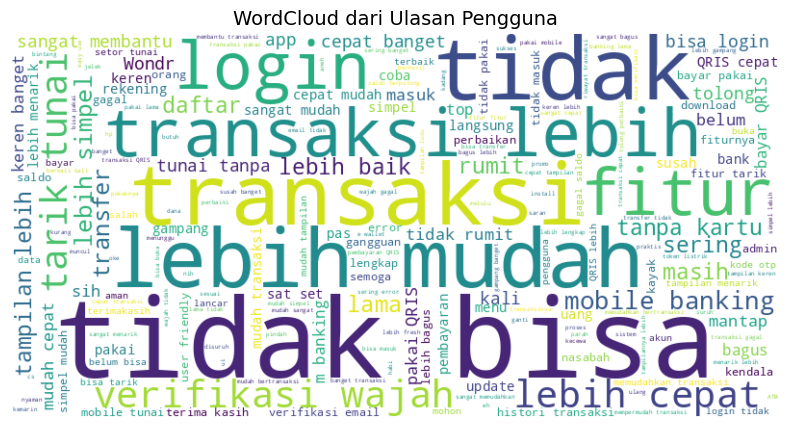

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud


# Gabungkan semua teks dari kolom "Content"
text = " ".join(df["content_stopword"].astype(str))

# Buat WordCloud
wordcloud = WordCloud(width=800, height=400, background_color="white", colormap="viridis", max_words=200).generate(text)

# Tampilkan WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud, interpolation="bilinear")
plt.axis("off")
plt.title("WordCloud dari Ulasan Pengguna", fontsize=14)
plt.show()


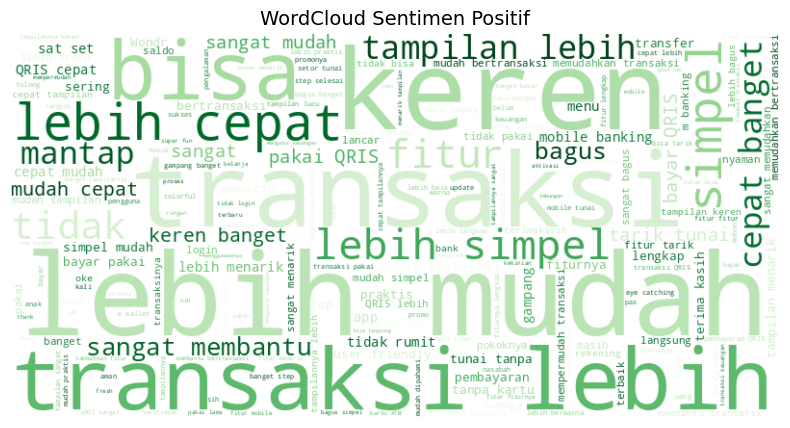

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Pastikan kolom content_stopword tersedia, jika tidak gunakan content
if 'content_stopword' in df.columns:
    df['clean_text'] = df['content_stopword']
else:
    df['clean_text'] = df['content']

# Gabungkan teks hanya untuk sentimen positif
positive_text = " ".join(df[df["sentimen"] == "Positive"]["clean_text"].astype(str))

# Buat WordCloud untuk Sentimen Positif
wordcloud_positive = WordCloud(
    width=800, height=400, background_color="white", colormap="Greens", max_words=200
).generate(positive_text)

# Tampilkan WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud_positive, interpolation="bilinear")
plt.axis("off")
plt.title("WordCloud Sentimen Positif", fontsize=14)
plt.show()


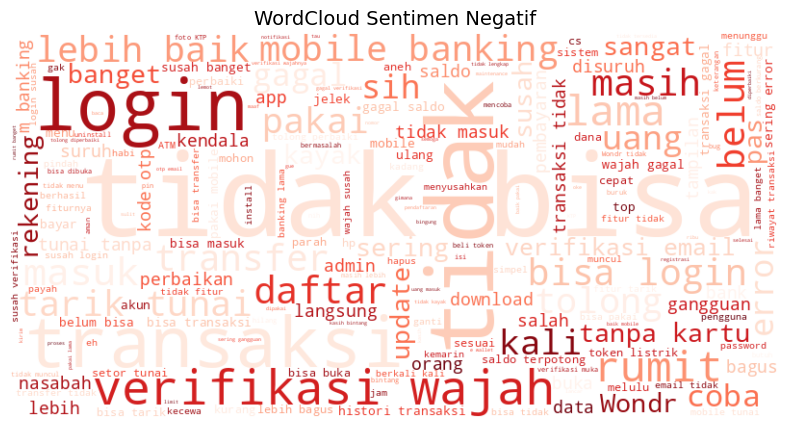

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
from wordcloud import WordCloud

# Gabungkan teks hanya untuk sentimen negatif
negative_text = " ".join(df[df["sentimen"] == "Negative"]["clean_text"].astype(str))

# Buat WordCloud untuk Sentimen Negatif
wordcloud_negative = WordCloud(
    width=800, height=400, background_color="white", colormap="Reds", max_words=200
).generate(negative_text)

# Tampilkan WordCloud
plt.figure(figsize=(10, 5))
plt.imshow(wordcloud_negative, interpolation="bilinear")
plt.axis("off")
plt.title("WordCloud Sentimen Negatif", fontsize=14)
plt.show()


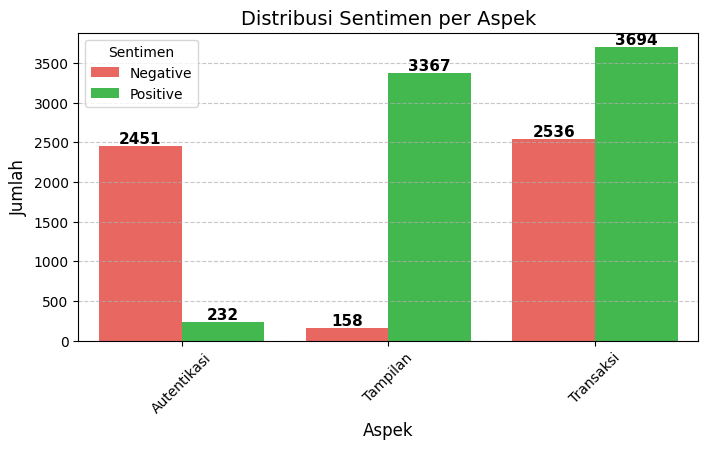

In [2]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# Pastikan kolom sesuai dengan format dataset
df.columns = ["Content", "Sentimen", "Aspek"]

# Menghitung jumlah sentimen per aspek
sentiment_counts = df.groupby(["Aspek", "Sentimen"]).size().reset_index(name="Jumlah")

# Pilihan warna dari gambar
palette = {"Positive": "#2ECC40", "Negative": "#FF5349"}  # Hijau & Merah

# Membuat visualisasi
plt.figure(figsize=(8, 4))
ax = sns.barplot(x="Aspek", y="Jumlah", hue="Sentimen", data=sentiment_counts, palette=palette)

# Menampilkan angka di atas batang, hanya jika nilai > 0
for p in ax.patches:
    height = p.get_height()
    if height > 0:  # Hanya menampilkan angka jika lebih dari 0
        ax.annotate(f'{int(height)}',
                    (p.get_x() + p.get_width() / 2., height),
                    ha='center', va='bottom',
                    fontsize=11, color='black', fontweight='bold')

# Menambahkan judul dan label
plt.title("Distribusi Sentimen per Aspek", fontsize=14)
plt.xlabel("Aspek", fontsize=12)
plt.ylabel("Jumlah", fontsize=12)
plt.xticks(rotation=45)  # Memiringkan label sumbu X agar lebih terbaca
plt.legend(title="Sentimen")
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Menampilkan diagram
plt.show()


<ipython-input-16-7b3bcec2589a>:27: FutureWarning: 

Passing `palette` without assigning `hue` is deprecated and will be removed in v0.14.0. Assign the `x` variable to `hue` and set `legend=False` for the same effect.

  ax = sns.barplot(x="Aspek", y="Jumlah", data=aspect_counts, palette=colors)


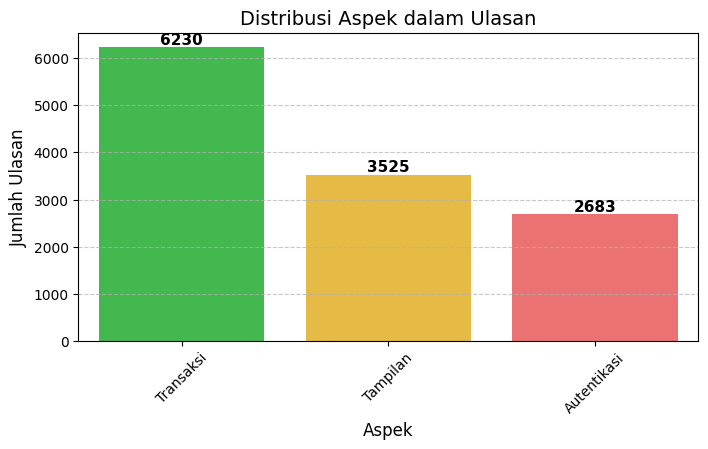

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns


# Pastikan kolom sesuai dengan format dataset
df.columns = ["Content", "Sentimen", "Aspek"]

# Menghitung jumlah ulasan per aspek
aspect_counts = df["Aspek"].value_counts().reset_index()
aspect_counts.columns = ["Aspek", "Jumlah"]

# Menentukan warna berdasarkan jumlah ulasan
colors = []
for count in aspect_counts["Jumlah"]:
    if count <= aspect_counts["Jumlah"].quantile(0.33):  # 33% terendah (Merah)
        colors.append("#FF5E5E")
    elif count <= aspect_counts["Jumlah"].quantile(0.66):  # 33-66% (Kuning)
        colors.append("#FFC72C")
    else:  # 33% tertinggi (Hijau)
        colors.append("#2ECC40")

# Membuat visualisasi
plt.figure(figsize=(8, 4))
ax = sns.barplot(x="Aspek", y="Jumlah", data=aspect_counts, palette=colors)

# Menampilkan angka di atas batang
for p in ax.patches:
    height = p.get_height()
    ax.annotate(f'{int(height)}',
                (p.get_x() + p.get_width() / 2., height),
                ha='center', va='bottom',
                fontsize=11, color='black', fontweight='bold')

# Menambahkan judul dan label
plt.title("Distribusi Aspek dalam Ulasan", fontsize=14)
plt.xlabel("Aspek", fontsize=12)
plt.ylabel("Jumlah Ulasan", fontsize=12)
plt.xticks(rotation=45)  # Memiringkan label sumbu X agar lebih terbaca
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Menampi


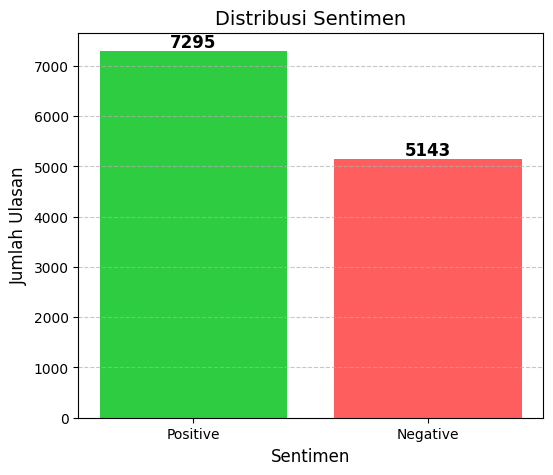

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Pastikan kolom sesuai dengan format dataset
df.columns = ["Content", "Sentimen", "Aspek"]

# Menghitung jumlah masing-masing sentimen
sentiment_counts = df["Sentimen"].value_counts()

# Warna sesuai gambar
colors = {"Positive": "#2ECC40", "Negative": "#FF5E5E"}

# Plot diagram batang
plt.figure(figsize=(6, 5))
bars = plt.bar(sentiment_counts.index, sentiment_counts.values, color=[colors[s] for s in sentiment_counts.index])

# Menampilkan angka di atas batang
for bar in bars:
    plt.text(bar.get_x() + bar.get_width()/2, bar.get_height(), f"{int(bar.get_height())}",
             ha="center", va="bottom", fontsize=12, fontweight="bold", color="black")

# Menambahkan judul dan label
plt.title("Distribusi Sentimen", fontsize=14)
plt.xlabel("Sentimen", fontsize=12)
plt.ylabel("Jumlah Ulasan", fontsize=12)
plt.xticks(rotation=0)
plt.grid(axis="y", linestyle="--", alpha=0.7)

# Menampilkan diagram
plt.show()


**KLASIFIKASI ASPEK**

**TAMPILAN**

In [ ]:
import pandas as pd
import numpy as np

df_dataset = pd.read_csv('/content/olahdatawondr.csv')
df_dataset


,content,sentimen,aspek,content_clean,content_casefolded,content_normalized,content_stopword,content_tokens,clean_text,content_stemmed
0,LEBIH simpel BNI MOBILE. MAKSUDNYA APA YAH nas...,Negative,Tampilan,LEBIH simpel BNI MOBILE MAKSUDNYA APA YAH nasa...,lebih simpel bni mobile maksudnya apa yah nasa...,lebih simpel bni mobile maksudnya apa ya nasab...,lebih simpel mobile maksudnya nasabah suruh mi...,"['lebih', 'simpel', 'mobile', 'maksudnya', 'na...",lebih simpel mobile maksudnya nasabah suruh mi...,"['lebih', 'simpel', 'mobile', 'maksud', 'nasab..."
1,Lebih simpel dari aplikasi BNI sebelumnya,Positive,Tampilan,Lebih simpel dari aplikasi BNI sebelumnya,lebih simpel dari aplikasi bni sebelumnya,lebih simpel dari aplikasi bni sebelumnya,lebih simpel,"['lebih', 'simpel']",lebih simpel,"['lebih', 'simpel']"
2,"Wah, notifikasi terkait konfirmasi transaksi l...",Positive,Tampilan,Wah notifikasi terkait konfirmasi transaksi la...,wah notifikasi terkait konfirmasi transaksi la...,wah notifikasi terkait konfirmasi transaksi la...,notifikasi terkait konfirmasi transaksi lama k...,"['notifikasi', 'terkait', 'konfirmasi', 'trans...",notifikasi terkait konfirmasi transaksi lama k...,"['notifikasi', 'kait', 'konfirmasi', 'transaks..."
3,"Lebih simpel fiturÂ² nya, tapi belum ada fitur...",Positive,Tampilan,Lebih simpel fitur nya tapi belum ada fitur ta...,lebih simpel fitur nya tapi belum ada fitur ta...,lebih simpel fitur ya tapi belum ada fitur tar...,lebih simpel fitur belum fitur tarik tunai lan...,"['lebih', 'simpel', 'fitur', 'belum', 'fitur',...",lebih simpel fitur belum fitur tarik tunai lan...,"['lebih', 'simpel', 'fitur', 'belum', 'fitur',..."
4,Keren Sih tapi gak ada bonus nya,Positive,Tampilan,Keren Sih tapi gak ada bonus nya,keren sih tapi gak ada bonus nya,keren sih tapi tidak ada bonus ya,keren sih tidak bonus,"['keren', 'sih', 'tidak', 'bonus']",keren sih tidak bonus,"['keren', 'sih', 'tidak', 'bonus']"
...,...,...,...,...,...,...,...,...,...,...
12433,Transaksi sat set ga pake lama love love wondr...,Positive,Transaksi,Transaksi sat set ga pake lama love love wondr,transaksi sat set ga pake lama love love wondr,transaksi sat set tidak pakai lama love love w...,transaksi sat set tidak pakai lama love love,"['transaksi', 'sat', 'set', 'tidak', 'pakai', ...",transaksi sat set tidak pakai lama love love,"['transaksi', 'sat', 'set', 'tidak', 'pakai', ..."
12434,Lebih simple dan praktis digunakan serta punya...,Positive,Transaksi,Lebih simple dan praktis digunakan serta punya...,lebih simple dan praktis digunakan serta punya...,lebih simpel dan praktis digunakan serta punya...,lebih simpel praktis fitur transaksi keuangan ...,"['lebih', 'simpel', 'praktis', 'fitur', 'trans...",lebih simpel praktis fitur transaksi keuangan ...,"['lebih', 'simpel', 'praktis', 'fitur', 'trans..."
12435,Error terus mau transfer padahal belum mencapa...,Negative,Transaksi,Error terus mau transfer padahal belum mencapa...,error terus mau transfer padahal belum mencapa...,error terus mau transfer padahal belum mencapa...,error transfer belum mencapai limit transfer j...,"['error', 'transfer', 'belum', 'mencapai', 'li...",error transfer belum mencapai limit transfer j...,"['error', 'transfer', 'belum', 'capai', 'limit..."
12436,Kalo bayar bayar sekarang pake wondr jadi mudah,Positive,Transaksi,Kalo bayar bayar sekarang pake wondr jadi mudah,kalo bayar bayar sekarang pake wondr jadi mudah,kalau bayar bayar sekarang pakai wondr jadi mudah,bayar bayar pakai mudah,"['bayar', 'bayar', 'pakai', 'mudah']",bayar bayar pakai mudah,"['bayar', 'bayar', 'pakai', 'mudah']"


In [ ]:
# Salin data untuk menghindari SettingWithCopyWarning
df_tampilan = df_dataset[['content_stemmed', 'aspek']].copy()

# Encoding label: 0 untuk Positif, 1 untuk Negatif
label_mapping = {'Tampilan': 0, 'Autentikasi': 1, 'Transaksi': 1}
df_tampilan.loc[:, 'tampilan_encoded'] = df_tampilan['aspek'].map(label_mapping)


In [ ]:
import pandas as pd

# Pisahkan data berdasarkan Tampilan_encoded
df_0 = df_tampilan[df_tampilan['tampilan_encoded'] == 0]
df_1 = df_tampilan[df_tampilan['tampilan_encoded'] == 1]

# Cari nilai content_stemmed yang muncul di Tampilan_encoded = 0
duplikat_dengan_0 = df_0['content_stemmed'].unique()

# Hapus hanya data Tampilan_encoded = 1 yang memiliki duplikat di Tampilan_encoded = 0
df_1_cleaned = df_1[~df_1['content_stemmed'].isin(duplikat_dengan_0)]

# Gabungkan kembali df_0 dan df_1_cleaned
df_tampilan = pd.concat([df_0, df_1_cleaned]).reset_index(drop=True)

df_tampilan


,content_stemmed,aspek,tampilan_encoded
0,"['lebih', 'simpel', 'mobile', 'maksud', 'nasab...",Tampilan,0
1,"['lebih', 'simpel']",Tampilan,0
2,"['notifikasi', 'kait', 'konfirmasi', 'transaks...",Tampilan,0
3,"['lebih', 'simpel', 'fitur', 'belum', 'fitur',...",Tampilan,0
4,"['keren', 'sih', 'tidak', 'bonus']",Tampilan,0
...,...,...,...
10893,"['transaksi', 'lebih', 'gampang']",Transaksi,1
10894,"['transaksi', 'sat', 'set', 'tidak', 'pakai', ...",Transaksi,1
10895,"['error', 'transfer', 'belum', 'capai', 'limit...",Transaksi,1
10896,"['bayar', 'bayar', 'pakai', 'mudah']",Transaksi,1


In [ ]:
# Step 1: TF-IDF Vectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer_tampilan = TfidfVectorizer()
X_tfidf = vectorizer_tampilan.fit_transform(df_tampilan['content_stemmed'])  # Mengubah teks menjadi fitur numerik
Y = df_tampilan['tampilan_encoded']  # Menggunakan label yang sudah di-encode (0: positif, 1: negatif)

In [ ]:
from sklearn.model_selection import train_test_split

# Step 2: Membagi Data Menjadi Data Latih dan Data Uji
X_train, X_test, Y_train, Y_test = train_test_split(X_tfidf, Y, test_size=0.2, random_state=42)

# Menampilkan jumlah data sebelum SMOTE
unique, counts = np.unique(Y_train, return_counts=True)
print("Jumlah data sebelum SMOTE:")
for cls, count in zip(unique, counts):
    print(f'Kelas {cls}: {count}')

Jumlah data sebelum SMOTE:
Kelas 0: 2826
Kelas 1: 5892


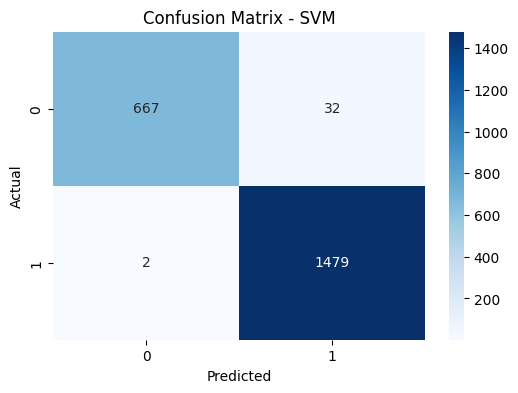


SVM Classification Report:
               precision    recall  f1-score   support

           0      0.997     0.954     0.975       699
           1      0.979     0.999     0.989      1481

    accuracy                          0.984      2180
   macro avg      0.988     0.976     0.982      2180
weighted avg      0.985     0.984     0.984      2180

Accuracy: 0.9844


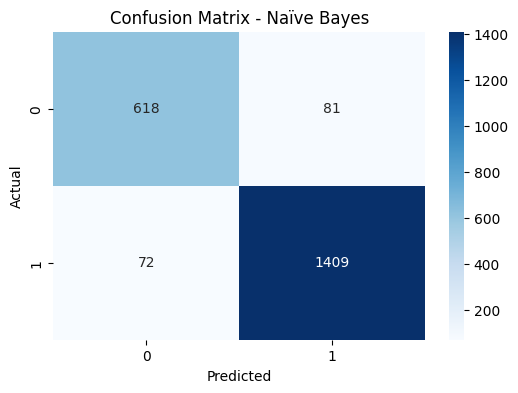


Naïve Bayes Classification Report:
               precision    recall  f1-score   support

           0      0.896     0.884     0.890       699
           1      0.946     0.951     0.949      1481

    accuracy                          0.930      2180
   macro avg      0.921     0.918     0.919      2180
weighted avg      0.930     0.930     0.930      2180

Accuracy: 0.9298


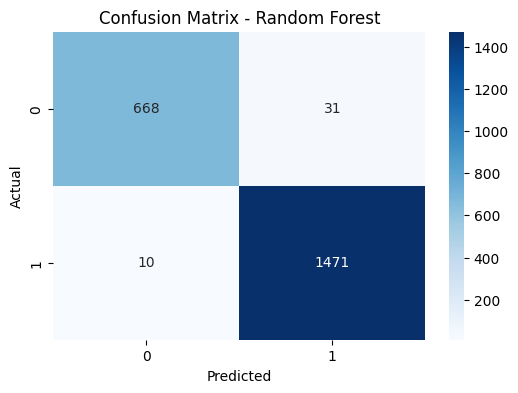


Random Forest Classification Report:
               precision    recall  f1-score   support

           0      0.985     0.956     0.970       699
           1      0.979     0.993     0.986      1481

    accuracy                          0.981      2180
   macro avg      0.982     0.974     0.978      2180
weighted avg      0.981     0.981     0.981      2180

Accuracy: 0.9812


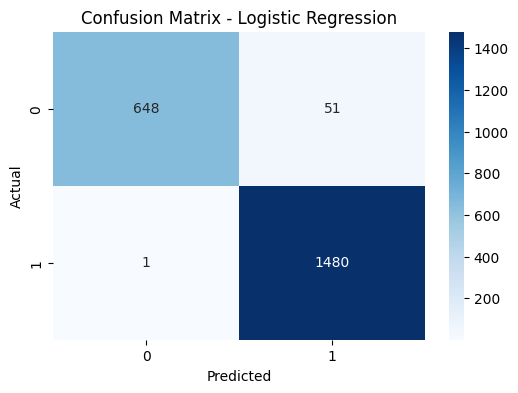


Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0      0.998     0.927     0.961       699
           1      0.967     0.999     0.983      1481

    accuracy                          0.976      2180
   macro avg      0.983     0.963     0.972      2180
weighted avg      0.977     0.976     0.976      2180

Accuracy: 0.9761


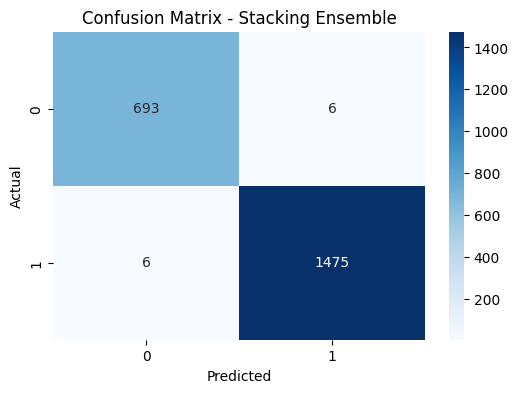


Stacking Ensemble Classification Report:
               precision    recall  f1-score   support

           0      0.991     0.991     0.991       699
           1      0.996     0.996     0.996      1481

    accuracy                          0.994      2180
   macro avg      0.994     0.994     0.994      2180
weighted avg      0.994     0.994     0.994      2180

Stacking Ensemble Accuracy: 0.9945


In [ ]:
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Inisialisasi Base Learners (Tidak Dilatih Dulu!)
svm_clf = SVC(kernel='rbf', probability=True, random_state=42)
nb_clf = MultinomialNB()
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
lr_clf = LogisticRegression(random_state=42)

# Evaluasi Model Individu
models = {
    'SVM': svm_clf,
    'Naïve Bayes': nb_clf,
    'Random Forest': rf_clf,
    'Logistic Regression': lr_clf
}

def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(title)
    plt.show()

# Latih dan Evaluasi Model Individu
for name, model in models.items():
    model.fit(X_train, Y_train)
    Y_pred = model.predict(X_test)
    plot_confusion_matrix(Y_test, Y_pred, f'Confusion Matrix - {name}')
    print(f'\n{name} Classification Report:\n', classification_report(Y_test, Y_pred, digits=3))
    print(f'Accuracy: {accuracy_score(Y_test, Y_pred):.4f}')
# **Stacking Ensemble (Gunakan Model Baru, Tidak dari Training Sebelumnya!)**
base_learners = [
    ('svm', SVC(kernel='rbf', probability=True, random_state=42, class_weight="balanced")),
    ('naive_bayes', MultinomialNB()),
    ('random_forest', RandomForestClassifier(n_estimators=100, random_state=42, class_weight="balanced"))
]
meta_learner = LogisticRegression(random_state=42, class_weight="balanced")
stacking_clf_tampilan = StackingClassifier(estimators=base_learners, final_estimator=meta_learner, passthrough=False, cv=5)

# Latih dan Evaluasi Stacking
stacking_clf_tampilan.fit(X_train, Y_train)
Y_pred_stack = stacking_clf_tampilan.predict(X_test)

plot_confusion_matrix(Y_test, Y_pred_stack, 'Confusion Matrix - Stacking Ensemble')
print('\nStacking Ensemble Classification Report:\n', classification_report(Y_test, Y_pred_stack,  digits=3))
print(f'Stacking Ensemble Accuracy: {accuracy_score(Y_test, Y_pred_stack):.4f}')


**SMOTE TAMPILAN**

In [ ]:
from imblearn.over_sampling import SMOTE

# Menampilkan jumlah data sebelum SMOTE
unique, counts = np.unique(Y_train, return_counts=True)
print("Jumlah data sebelum SMOTE:")
for cls, count in zip(unique, counts):
    print(f'Kelas {cls}: {count}')

# Menyeimbangkan Data dengan SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, Y_train_resampled = smote.fit_resample(X_train, Y_train)

# Menampilkan jumlah data setelah SMOTE
unique_resampled, counts_resampled = np.unique(Y_train_resampled, return_counts=True)
print("\nJumlah data setelah SMOTE:")
for cls, count in zip(unique_resampled, counts_resampled):
    print(f'Kelas {cls}: {count}')

Jumlah data sebelum SMOTE:
Kelas 0: 2826
Kelas 1: 5892

Jumlah data setelah SMOTE:
Kelas 0: 5892
Kelas 1: 5892


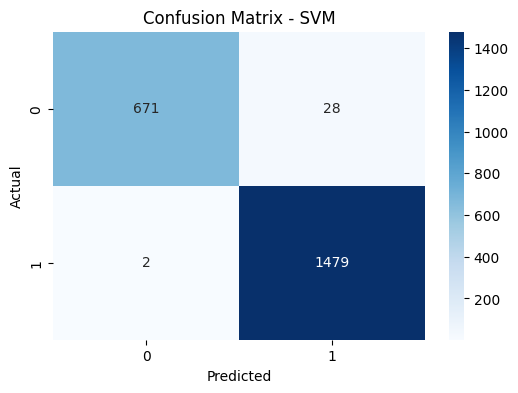


SVM Classification Report:
               precision    recall  f1-score   support

           0      0.997     0.960     0.978       699
           1      0.981     0.999     0.990      1481

    accuracy                          0.986      2180
   macro avg      0.989     0.979     0.984      2180
weighted avg      0.986     0.986     0.986      2180

Accuracy: 0.9862


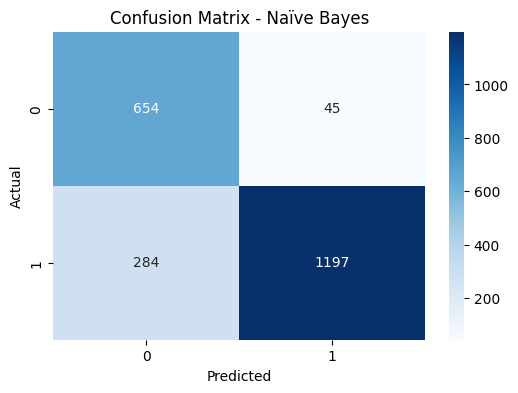


Naïve Bayes Classification Report:
               precision    recall  f1-score   support

           0      0.697     0.936     0.799       699
           1      0.964     0.808     0.879      1481

    accuracy                          0.849      2180
   macro avg      0.830     0.872     0.839      2180
weighted avg      0.878     0.849     0.853      2180

Accuracy: 0.8491


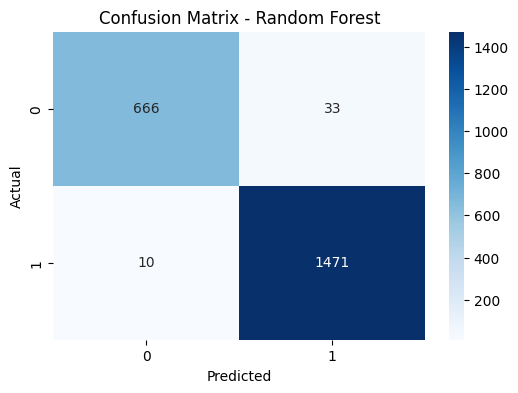


Random Forest Classification Report:
               precision    recall  f1-score   support

           0      0.985     0.953     0.969       699
           1      0.978     0.993     0.986      1481

    accuracy                          0.980      2180
   macro avg      0.982     0.973     0.977      2180
weighted avg      0.980     0.980     0.980      2180

Accuracy: 0.9803


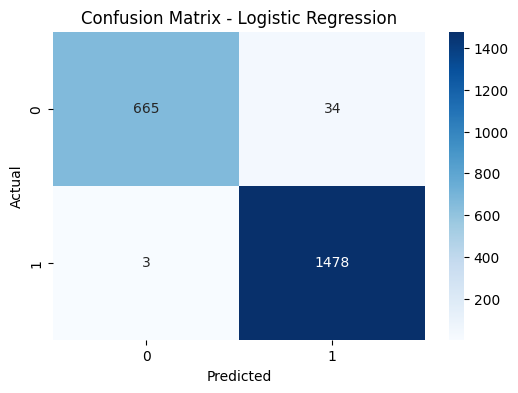


Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0      0.996     0.951     0.973       699
           1      0.978     0.998     0.988      1481

    accuracy                          0.983      2180
   macro avg      0.987     0.975     0.980      2180
weighted avg      0.983     0.983     0.983      2180

Accuracy: 0.9830


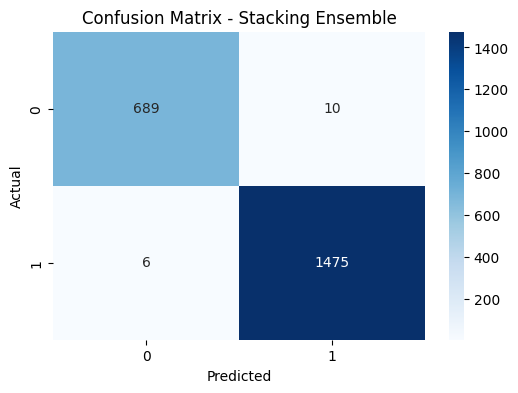


Stacking Ensemble Classification Report:
               precision    recall  f1-score   support

           0      0.991     0.986     0.989       699
           1      0.993     0.996     0.995      1481

    accuracy                          0.993      2180
   macro avg      0.992     0.991     0.992      2180
weighted avg      0.993     0.993     0.993      2180

Stacking Ensemble Accuracy: 0.9927


In [ ]:
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Inisialisasi Base Learners (Tidak Dilatih Dulu!)
svm_clf = SVC(kernel='rbf', probability=True, random_state=42)
nb_clf = MultinomialNB()
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
lr_clf = LogisticRegression(random_state=42)

# Evaluasi Model Individu
models = {
    'SVM': svm_clf,
    'Naïve Bayes': nb_clf,
    'Random Forest': rf_clf,
    'Logistic Regression': lr_clf
}

def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(title)
    plt.show()

# Latih dan Evaluasi Model Individu
for name, model in models.items():
    model.fit(X_train_resampled, Y_train_resampled)
    Y_pred = model.predict(X_test)
    plot_confusion_matrix(Y_test, Y_pred, f'Confusion Matrix - {name}')
    print(f'\n{name} Classification Report:\n', classification_report(Y_test, Y_pred, digits=3))
    print(f'Accuracy: {accuracy_score(Y_test, Y_pred):.4f}')

# **Stacking Ensemble (Gunakan Model Baru, Tidak dari Training Sebelumnya!)**
base_learners = [
    ('svm', SVC(kernel='rbf', probability=True, random_state=42)),
    ('naive_bayes', MultinomialNB()),
    ('random_forest', RandomForestClassifier(n_estimators=100, random_state=42))
]
meta_learner = LogisticRegression(random_state=42)

stacking_clf = StackingClassifier(estimators=base_learners, final_estimator=meta_learner, passthrough=False, cv=5)

# Latih dan Evaluasi Stacking
stacking_clf.fit(X_train_resampled, Y_train_resampled)
Y_pred_stack = stacking_clf.predict(X_test)

plot_confusion_matrix(Y_test, Y_pred_stack, 'Confusion Matrix - Stacking Ensemble')
print('\nStacking Ensemble Classification Report:\n', classification_report(Y_test, Y_pred_stack,  digits=3))
print(f'Stacking Ensemble Accuracy: {accuracy_score(Y_test, Y_pred_stack):.4f}')


**Autentikasi**

In [ ]:
import pandas as pd
import numpy as np

df_dataset = pd.read_csv('/content/olahdatawondr (2).csv')
df_dataset


,content,sentimen,aspek,content_clean,content_casefolded,content_normalized,content_stopword,content_tokens,clean_text,content_stemmed
0,LEBIH simpel BNI MOBILE. MAKSUDNYA APA YAH nas...,Negative,Tampilan,LEBIH simpel BNI MOBILE MAKSUDNYA APA YAH nasa...,lebih simpel bni mobile maksudnya apa yah nasa...,lebih simpel bni mobile maksudnya apa ya nasab...,lebih simpel mobile maksudnya nasabah suruh mi...,"['lebih', 'simpel', 'mobile', 'maksudnya', 'na...",lebih simpel mobile maksudnya nasabah suruh mi...,"['lebih', 'simpel', 'mobile', 'maksud', 'nasab..."
1,Lebih simpel dari aplikasi BNI sebelumnya,Positive,Tampilan,Lebih simpel dari aplikasi BNI sebelumnya,lebih simpel dari aplikasi bni sebelumnya,lebih simpel dari aplikasi bni sebelumnya,lebih simpel,"['lebih', 'simpel']",lebih simpel,"['lebih', 'simpel']"
2,"Wah, notifikasi terkait konfirmasi transaksi l...",Positive,Tampilan,Wah notifikasi terkait konfirmasi transaksi la...,wah notifikasi terkait konfirmasi transaksi la...,wah notifikasi terkait konfirmasi transaksi la...,notifikasi terkait konfirmasi transaksi lama k...,"['notifikasi', 'terkait', 'konfirmasi', 'trans...",notifikasi terkait konfirmasi transaksi lama k...,"['notifikasi', 'kait', 'konfirmasi', 'transaks..."
3,"Lebih simpel fiturÂ² nya, tapi belum ada fitur...",Positive,Tampilan,Lebih simpel fitur nya tapi belum ada fitur ta...,lebih simpel fitur nya tapi belum ada fitur ta...,lebih simpel fitur ya tapi belum ada fitur tar...,lebih simpel fitur belum fitur tarik tunai lan...,"['lebih', 'simpel', 'fitur', 'belum', 'fitur',...",lebih simpel fitur belum fitur tarik tunai lan...,"['lebih', 'simpel', 'fitur', 'belum', 'fitur',..."
4,Keren Sih tapi gak ada bonus nya,Positive,Tampilan,Keren Sih tapi gak ada bonus nya,keren sih tapi gak ada bonus nya,keren sih tapi tidak ada bonus ya,keren sih tidak bonus,"['keren', 'sih', 'tidak', 'bonus']",keren sih tidak bonus,"['keren', 'sih', 'tidak', 'bonus']"
...,...,...,...,...,...,...,...,...,...,...
12433,Transaksi sat set ga pake lama love love wondr...,Positive,Transaksi,Transaksi sat set ga pake lama love love wondr,transaksi sat set ga pake lama love love wondr,transaksi sat set tidak pakai lama love love w...,transaksi sat set tidak pakai lama love love,"['transaksi', 'sat', 'set', 'tidak', 'pakai', ...",transaksi sat set tidak pakai lama love love,"['transaksi', 'sat', 'set', 'tidak', 'pakai', ..."
12434,Lebih simple dan praktis digunakan serta punya...,Positive,Transaksi,Lebih simple dan praktis digunakan serta punya...,lebih simple dan praktis digunakan serta punya...,lebih simpel dan praktis digunakan serta punya...,lebih simpel praktis fitur transaksi keuangan ...,"['lebih', 'simpel', 'praktis', 'fitur', 'trans...",lebih simpel praktis fitur transaksi keuangan ...,"['lebih', 'simpel', 'praktis', 'fitur', 'trans..."
12435,Error terus mau transfer padahal belum mencapa...,Negative,Transaksi,Error terus mau transfer padahal belum mencapa...,error terus mau transfer padahal belum mencapa...,error terus mau transfer padahal belum mencapa...,error transfer belum mencapai limit transfer j...,"['error', 'transfer', 'belum', 'mencapai', 'li...",error transfer belum mencapai limit transfer j...,"['error', 'transfer', 'belum', 'capai', 'limit..."
12436,Kalo bayar bayar sekarang pake wondr jadi mudah,Positive,Transaksi,Kalo bayar bayar sekarang pake wondr jadi mudah,kalo bayar bayar sekarang pake wondr jadi mudah,kalau bayar bayar sekarang pakai wondr jadi mudah,bayar bayar pakai mudah,"['bayar', 'bayar', 'pakai', 'mudah']",bayar bayar pakai mudah,"['bayar', 'bayar', 'pakai', 'mudah']"


In [ ]:
# Salin data untuk menghindari SettingWithCopyWarning
df_Autentikasi = df_dataset[['content_stemmed', 'aspek']].copy()

# Encoding label: 0 untuk Positif, 1 untuk Negatif
label_mapping = {'Autentikasi': 0, 'Tampilan': 1, 'Transaksi': 1}
df_Autentikasi.loc[:, 'autentikasi_encoded'] = df_Autentikasi['aspek'].map(label_mapping)


In [ ]:
df_Autentikasi

,content_stemmed,aspek,autentikasi_encoded
0,"['lebih', 'simpel', 'mobile', 'maksud', 'nasab...",Tampilan,1
1,"['lebih', 'simpel']",Tampilan,1
2,"['notifikasi', 'kait', 'konfirmasi', 'transaks...",Tampilan,1
3,"['lebih', 'simpel', 'fitur', 'belum', 'fitur',...",Tampilan,1
4,"['keren', 'sih', 'tidak', 'bonus']",Tampilan,1
...,...,...,...
12433,"['transaksi', 'sat', 'set', 'tidak', 'pakai', ...",Transaksi,1
12434,"['lebih', 'simpel', 'praktis', 'fitur', 'trans...",Transaksi,1
12435,"['error', 'transfer', 'belum', 'capai', 'limit...",Transaksi,1
12436,"['bayar', 'bayar', 'pakai', 'mudah']",Transaksi,1


In [ ]:
import pandas as pd

# Pisahkan data berdasarkan Tampilan_encoded
df_0 = df_Autentikasi[df_Autentikasi['autentikasi_encoded'] == 0]
df_1 = df_Autentikasi[df_Autentikasi['autentikasi_encoded'] == 1]

# Cari nilai content_stemmed yang muncul di Tampilan_encoded = 0
duplikat_dengan_0 = df_0['content_stemmed'].unique()

# Hapus hanya data Tampilan_encoded = 1 yang memiliki duplikat di Tampilan_encoded = 0
df_1_cleaned = df_1[~df_1['content_stemmed'].isin(duplikat_dengan_0)]

# Gabungkan kembali df_0 dan df_1_cleaned
df_Autentikasi = pd.concat([df_0, df_1_cleaned]).reset_index(drop=True)

df_Autentikasi


,content_stemmed,aspek,autentikasi_encoded
0,"['daftarin', 'orang', 'tua', 'verifikasi', 'wa...",Autentikasi,0
1,"['install', 'verifikasi', 'gagal', 'rumit', 's...",Autentikasi,0
2,"['verifikasi', 'email', 'jam', 'tidak', 'kirim...",Autentikasi,0
3,"['download', 'mobile', 'banking', 'tidak', 'su...",Autentikasi,0
4,"['tidak', 'bisa', 'buka', 'tulis', 'tidak', 'b...",Autentikasi,0
...,...,...,...
11823,"['transaksi', 'sat', 'set', 'tidak', 'pakai', ...",Transaksi,1
11824,"['lebih', 'simpel', 'praktis', 'fitur', 'trans...",Transaksi,1
11825,"['error', 'transfer', 'belum', 'capai', 'limit...",Transaksi,1
11826,"['bayar', 'bayar', 'pakai', 'mudah']",Transaksi,1


In [ ]:
# Step 1: TF-IDF Vectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer_autentikasi = TfidfVectorizer()
X_tfidf = vectorizer_autentikasi.fit_transform(df_Autentikasi['content_stemmed'])  # Mengubah teks menjadi fitur numerik
Y = df_Autentikasi['autentikasi_encoded']  # Menggunakan label yang sudah di-encode (0: positif, 1: negatif)

In [ ]:
from sklearn.model_selection import train_test_split

# Step 2: Membagi Data Menjadi Data Latih dan Data Uji
X_train, X_test, Y_train, Y_test = train_test_split(X_tfidf, Y, test_size=0.2, random_state=42)

# Menampilkan jumlah data sebelum SMOTE
unique, counts = np.unique(Y_train, return_counts=True)
print("Jumlah data sebelum SMOTE:")
for cls, count in zip(unique, counts):
    print(f'Kelas {cls}: {count}')

Jumlah data sebelum SMOTE:
Kelas 0: 2135
Kelas 1: 7327


In [ ]:
print(f"Total X_train: {X_train.shape[0]}")
print(f"Total Y_train: {Y_train.shape[0]}")


Total X_train: 9462
Total Y_train: 9462


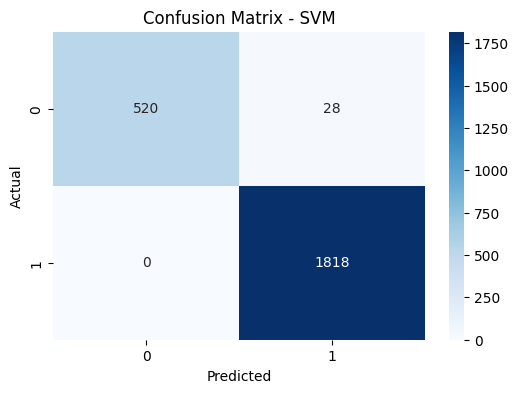


SVM Classification Report:
               precision    recall  f1-score   support

           0      1.000     0.949     0.974       548
           1      0.985     1.000     0.992      1818

    accuracy                          0.988      2366
   macro avg      0.992     0.974     0.983      2366
weighted avg      0.988     0.988     0.988      2366

Accuracy: 0.9882


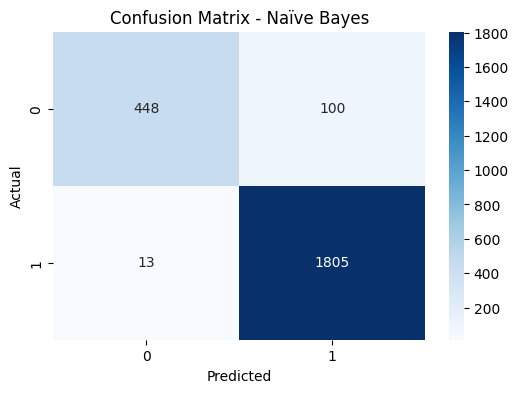


Naïve Bayes Classification Report:
               precision    recall  f1-score   support

           0      0.972     0.818     0.888       548
           1      0.948     0.993     0.970      1818

    accuracy                          0.952      2366
   macro avg      0.960     0.905     0.929      2366
weighted avg      0.953     0.952     0.951      2366

Accuracy: 0.9522


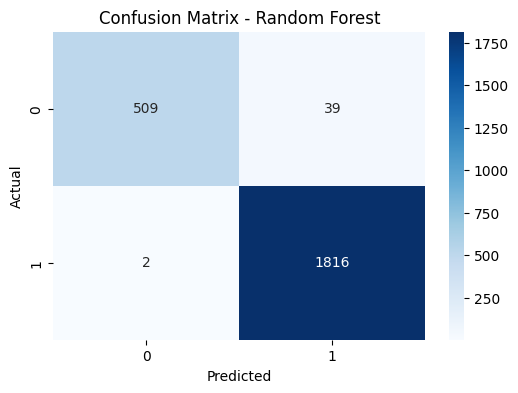


Random Forest Classification Report:
               precision    recall  f1-score   support

           0      0.996     0.929     0.961       548
           1      0.979     0.999     0.989      1818

    accuracy                          0.983      2366
   macro avg      0.988     0.964     0.975      2366
weighted avg      0.983     0.983     0.982      2366

Accuracy: 0.9827


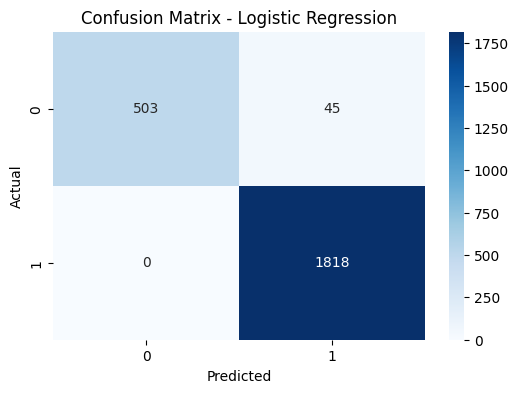


Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0      1.000     0.918     0.957       548
           1      0.976     1.000     0.988      1818

    accuracy                          0.981      2366
   macro avg      0.988     0.959     0.972      2366
weighted avg      0.981     0.981     0.981      2366

Accuracy: 0.9810


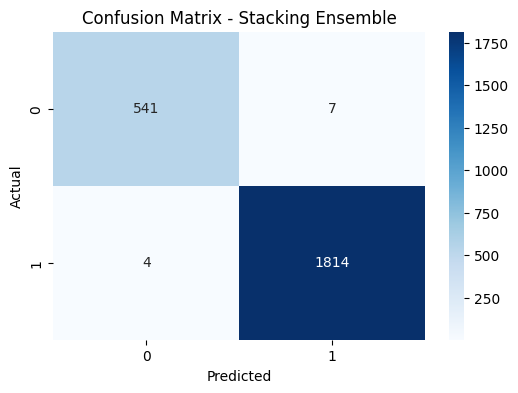


Stacking Ensemble Classification Report:
               precision    recall  f1-score   support

           0      0.993     0.987     0.990       548
           1      0.996     0.998     0.997      1818

    accuracy                          0.995      2366
   macro avg      0.994     0.993     0.993      2366
weighted avg      0.995     0.995     0.995      2366

Stacking Ensemble Accuracy: 0.9954


In [ ]:
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Inisialisasi Base Learners (Tidak Dilatih Dulu!)
svm_clf = SVC(kernel='rbf', probability=True, random_state=42)
nb_clf = MultinomialNB()
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
lr_clf = LogisticRegression(random_state=42)

# Evaluasi Model Individu
models = {
    'SVM': svm_clf,
    'Naïve Bayes': nb_clf,
    'Random Forest': rf_clf,
    'Logistic Regression': lr_clf
}

def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(title)
    plt.show()

# Latih dan Evaluasi Model Individu
for name, model in models.items():
    model.fit(X_train, Y_train)
    Y_pred = model.predict(X_test)
    plot_confusion_matrix(Y_test, Y_pred, f'Confusion Matrix - {name}')
    print(f'\n{name} Classification Report:\n', classification_report(Y_test, Y_pred, digits=3))
    print(f'Accuracy: {accuracy_score(Y_test, Y_pred):.4f}')

# **Stacking Ensemble (Gunakan Model Baru, Tidak dari Training Sebelumnya!)**
base_learners = [
    ('svm', SVC(kernel='rbf', probability=True, random_state=42, class_weight="balanced")),
    ('naive_bayes', MultinomialNB()),
    ('random_forest', RandomForestClassifier(n_estimators=100, random_state=42, class_weight="balanced"))
]
meta_learner = LogisticRegression(random_state=42, class_weight="balanced")

stacking_clf_autentikasi = StackingClassifier(estimators=base_learners, final_estimator=meta_learner, passthrough=False, cv=5)

# Latih dan Evaluasi Stacking
stacking_clf_autentikasi.fit(X_train, Y_train)
Y_pred_stack = stacking_clf_autentikasi.predict(X_test)

plot_confusion_matrix(Y_test, Y_pred_stack, 'Confusion Matrix - Stacking Ensemble')
print('\nStacking Ensemble Classification Report:\n', classification_report(Y_test, Y_pred_stack, digits=3))
print(f'Stacking Ensemble Accuracy: {accuracy_score(Y_test, Y_pred_stack):.4f}')


**SMOTE AUTENTIKASI**

In [ ]:
from imblearn.over_sampling import SMOTE

from sklearn.model_selection import train_test_split


# Menampilkan jumlah data sebelum SMOTE
unique, counts = np.unique(Y_train, return_counts=True)
print("Jumlah data sebelum SMOTE:")
for cls, count in zip(unique, counts):
    print(f'Kelas {cls}: {count}')

# Menyeimbangkan Data dengan SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, Y_train_resampled = smote.fit_resample(X_train, Y_train)

# Menampilkan jumlah data setelah SMOTE
unique_resampled, counts_resampled = np.unique(Y_train_resampled, return_counts=True)
print("\nJumlah data setelah SMOTE:")
for cls, count in zip(unique_resampled, counts_resampled):
    print(f'Kelas {cls}: {count}')

Jumlah data sebelum SMOTE:
Kelas 0: 2135
Kelas 1: 7327

Jumlah data setelah SMOTE:
Kelas 0: 7327
Kelas 1: 7327


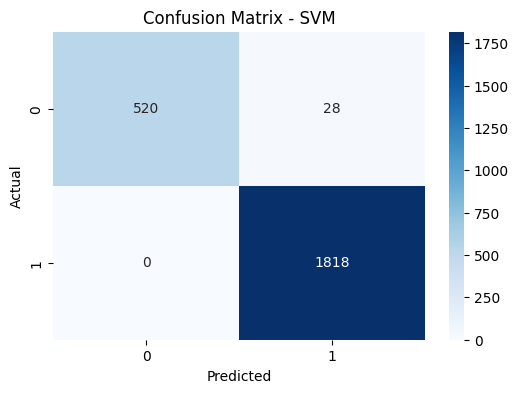


SVM Classification Report:
               precision    recall  f1-score   support

           0      1.000     0.949     0.974       548
           1      0.985     1.000     0.992      1818

    accuracy                          0.988      2366
   macro avg      0.992     0.974     0.983      2366
weighted avg      0.988     0.988     0.988      2366

Accuracy: 0.9882


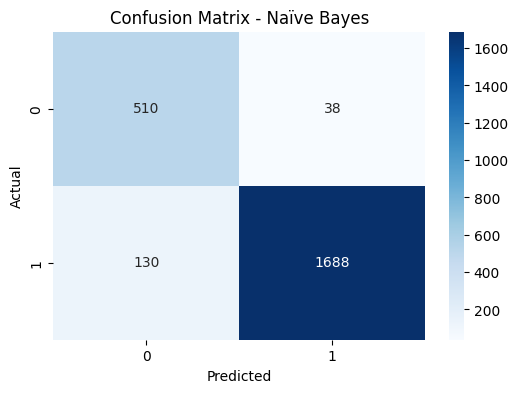


Naïve Bayes Classification Report:
               precision    recall  f1-score   support

           0      0.797     0.931     0.859       548
           1      0.978     0.928     0.953      1818

    accuracy                          0.929      2366
   macro avg      0.887     0.930     0.906      2366
weighted avg      0.936     0.929     0.931      2366

Accuracy: 0.9290


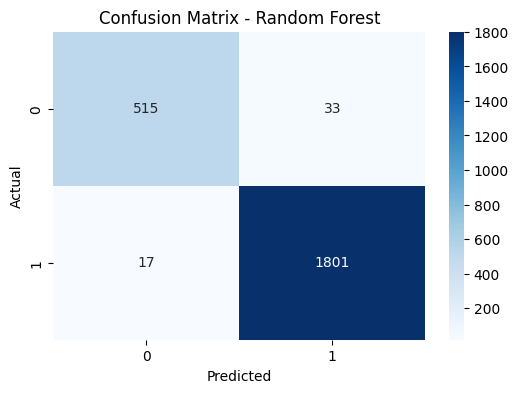


Random Forest Classification Report:
               precision    recall  f1-score   support

           0      0.968     0.940     0.954       548
           1      0.982     0.991     0.986      1818

    accuracy                          0.979      2366
   macro avg      0.975     0.965     0.970      2366
weighted avg      0.979     0.979     0.979      2366

Accuracy: 0.9789


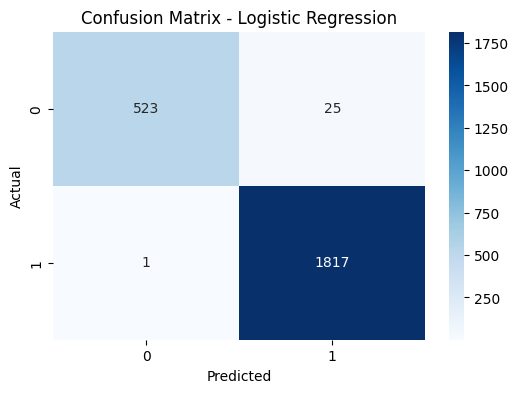


Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0      0.998     0.954     0.976       548
           1      0.986     0.999     0.993      1818

    accuracy                          0.989      2366
   macro avg      0.992     0.977     0.984      2366
weighted avg      0.989     0.989     0.989      2366

Accuracy: 0.9890


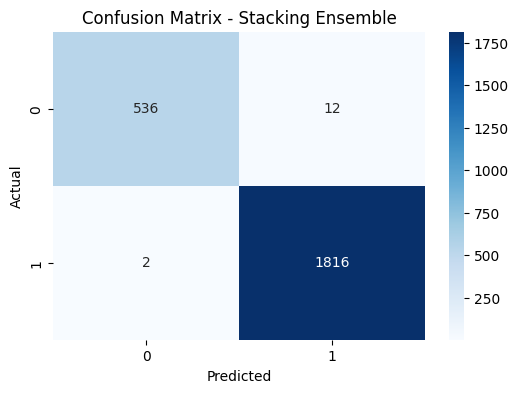


Stacking Ensemble Classification Report:
               precision    recall  f1-score   support

           0      0.996     0.978     0.987       548
           1      0.993     0.999     0.996      1818

    accuracy                          0.994      2366
   macro avg      0.995     0.989     0.992      2366
weighted avg      0.994     0.994     0.994      2366

Stacking Ensemble Accuracy: 0.9941


In [ ]:
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Inisialisasi Base Learners (Tidak Dilatih Dulu!)
svm_clf = SVC(kernel='rbf', probability=True, random_state=42)
nb_clf = MultinomialNB()
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
lr_clf = LogisticRegression(random_state=42)

# Evaluasi Model Individu
models = {
    'SVM': svm_clf,
    'Naïve Bayes': nb_clf,
    'Random Forest': rf_clf,
    'Logistic Regression': lr_clf
}

def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(title)
    plt.show()

# Latih dan Evaluasi Model Individu
for name, model in models.items():
    model.fit(X_train_resampled, Y_train_resampled)
    Y_pred = model.predict(X_test)
    plot_confusion_matrix(Y_test, Y_pred, f'Confusion Matrix - {name}')
    print(f'\n{name} Classification Report:\n', classification_report(Y_test, Y_pred, digits=3))
    print(f'Accuracy: {accuracy_score(Y_test, Y_pred):.4f}')

# **Stacking Ensemble (Gunakan Model Baru, Tidak dari Training Sebelumnya!)**
base_learners = [
    ('svm', SVC(kernel='rbf', probability=True, random_state=42)),
    ('naive_bayes', MultinomialNB()),
    ('random_forest', RandomForestClassifier(n_estimators=100, random_state=42))
]
meta_learner = LogisticRegression(random_state=42)

stacking_clf = StackingClassifier(estimators=base_learners, final_estimator=meta_learner, passthrough=False, cv=5)

# Latih dan Evaluasi Stacking
stacking_clf.fit(X_train_resampled, Y_train_resampled)
Y_pred_stack = stacking_clf.predict(X_test)

plot_confusion_matrix(Y_test, Y_pred_stack, 'Confusion Matrix - Stacking Ensemble')
print('\nStacking Ensemble Classification Report:\n', classification_report(Y_test, Y_pred_stack, digits=3))
print(f'Stacking Ensemble Accuracy: {accuracy_score(Y_test, Y_pred_stack):.4f}')


**Transaksi**

In [ ]:
import pandas as pd
import numpy as np

df_dataset = pd.read_csv('/content/olahdatawondr (2).csv')
df_dataset


,content,sentimen,aspek,content_clean,content_casefolded,content_normalized,content_stopword,content_tokens,clean_text,content_stemmed
0,LEBIH simpel BNI MOBILE. MAKSUDNYA APA YAH nas...,Negative,Tampilan,LEBIH simpel BNI MOBILE MAKSUDNYA APA YAH nasa...,lebih simpel bni mobile maksudnya apa yah nasa...,lebih simpel bni mobile maksudnya apa ya nasab...,lebih simpel mobile maksudnya nasabah suruh mi...,"['lebih', 'simpel', 'mobile', 'maksudnya', 'na...",lebih simpel mobile maksudnya nasabah suruh mi...,"['lebih', 'simpel', 'mobile', 'maksud', 'nasab..."
1,Lebih simpel dari aplikasi BNI sebelumnya,Positive,Tampilan,Lebih simpel dari aplikasi BNI sebelumnya,lebih simpel dari aplikasi bni sebelumnya,lebih simpel dari aplikasi bni sebelumnya,lebih simpel,"['lebih', 'simpel']",lebih simpel,"['lebih', 'simpel']"
2,"Wah, notifikasi terkait konfirmasi transaksi l...",Positive,Tampilan,Wah notifikasi terkait konfirmasi transaksi la...,wah notifikasi terkait konfirmasi transaksi la...,wah notifikasi terkait konfirmasi transaksi la...,notifikasi terkait konfirmasi transaksi lama k...,"['notifikasi', 'terkait', 'konfirmasi', 'trans...",notifikasi terkait konfirmasi transaksi lama k...,"['notifikasi', 'kait', 'konfirmasi', 'transaks..."
3,"Lebih simpel fiturÂ² nya, tapi belum ada fitur...",Positive,Tampilan,Lebih simpel fitur nya tapi belum ada fitur ta...,lebih simpel fitur nya tapi belum ada fitur ta...,lebih simpel fitur ya tapi belum ada fitur tar...,lebih simpel fitur belum fitur tarik tunai lan...,"['lebih', 'simpel', 'fitur', 'belum', 'fitur',...",lebih simpel fitur belum fitur tarik tunai lan...,"['lebih', 'simpel', 'fitur', 'belum', 'fitur',..."
4,Keren Sih tapi gak ada bonus nya,Positive,Tampilan,Keren Sih tapi gak ada bonus nya,keren sih tapi gak ada bonus nya,keren sih tapi tidak ada bonus ya,keren sih tidak bonus,"['keren', 'sih', 'tidak', 'bonus']",keren sih tidak bonus,"['keren', 'sih', 'tidak', 'bonus']"
...,...,...,...,...,...,...,...,...,...,...
12433,Transaksi sat set ga pake lama love love wondr...,Positive,Transaksi,Transaksi sat set ga pake lama love love wondr,transaksi sat set ga pake lama love love wondr,transaksi sat set tidak pakai lama love love w...,transaksi sat set tidak pakai lama love love,"['transaksi', 'sat', 'set', 'tidak', 'pakai', ...",transaksi sat set tidak pakai lama love love,"['transaksi', 'sat', 'set', 'tidak', 'pakai', ..."
12434,Lebih simple dan praktis digunakan serta punya...,Positive,Transaksi,Lebih simple dan praktis digunakan serta punya...,lebih simple dan praktis digunakan serta punya...,lebih simpel dan praktis digunakan serta punya...,lebih simpel praktis fitur transaksi keuangan ...,"['lebih', 'simpel', 'praktis', 'fitur', 'trans...",lebih simpel praktis fitur transaksi keuangan ...,"['lebih', 'simpel', 'praktis', 'fitur', 'trans..."
12435,Error terus mau transfer padahal belum mencapa...,Negative,Transaksi,Error terus mau transfer padahal belum mencapa...,error terus mau transfer padahal belum mencapa...,error terus mau transfer padahal belum mencapa...,error transfer belum mencapai limit transfer j...,"['error', 'transfer', 'belum', 'mencapai', 'li...",error transfer belum mencapai limit transfer j...,"['error', 'transfer', 'belum', 'capai', 'limit..."
12436,Kalo bayar bayar sekarang pake wondr jadi mudah,Positive,Transaksi,Kalo bayar bayar sekarang pake wondr jadi mudah,kalo bayar bayar sekarang pake wondr jadi mudah,kalau bayar bayar sekarang pakai wondr jadi mudah,bayar bayar pakai mudah,"['bayar', 'bayar', 'pakai', 'mudah']",bayar bayar pakai mudah,"['bayar', 'bayar', 'pakai', 'mudah']"


In [ ]:
# Salin data untuk menghindari SettingWithCopyWarning
df_transaksi = df_dataset[['content_stemmed', 'aspek']].copy()

# Encoding label: 0 untuk Positif, 1 untuk Negatif
label_mapping = {'Transaksi': 0, 'Tampilan': 1, 'Autentikasi': 1}
df_transaksi.loc[:, 'transaksi_encoded'] = df_transaksi['aspek'].map(label_mapping)


In [ ]:
import pandas as pd

# Pisahkan data berdasarkan Tampilan_encoded
df_0 = df_transaksi[df_transaksi['transaksi_encoded'] == 0]
df_1 = df_transaksi[df_transaksi['transaksi_encoded'] == 1]

# Cari nilai content_stemmed yang muncul di Tampilan_encoded = 0
duplikat_dengan_0 = df_0['content_stemmed'].unique()

# Hapus hanya data Tampilan_encoded = 1 yang memiliki duplikat di Tampilan_encoded = 0
df_1_cleaned = df_1[~df_1['content_stemmed'].isin(duplikat_dengan_0)]

# Gabungkan kembali df_0 dan df_1_cleaned
df_transaksi = pd.concat([df_0, df_1_cleaned]).reset_index(drop=True)

df_transaksi


,content_stemmed,aspek,transaksi_encoded
0,"['notifikasi', 'kait', 'konfirmasi', 'transaks...",Transaksi,0
1,"['pakai', 'baras', 'minimum', 'transaksi', 'ti...",Transaksi,0
2,"['fitur', 'notifikasi', 'transaksi', 'masuk', ...",Transaksi,0
3,"['tidak', 'bisa', 'buka', 'tulis', 'tidak', 'b...",Transaksi,0
4,"['bagus', 'mudah', 'transaksi']",Transaksi,0
...,...,...,...
10533,"['kenal', 'wajah', 'sering', 'salah', 'sistem'...",Autentikasi,1
10534,"['system', 'error', 'verifikasi', 'wajah']",Autentikasi,1
10535,"['aneh', 'nomor', 'hp', 'masuk', 'tulis', 'tid...",Autentikasi,1
10536,"['verifikasi', 'muka', 'sangat', 'bingung', 's...",Autentikasi,1


In [ ]:
# Step 1: TF-IDF Vectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer_transaksi = TfidfVectorizer()
X_tfidf = vectorizer_transaksi.fit_transform(df_transaksi['content_stemmed'])  # Mengubah teks menjadi fitur numerik
Y = df_transaksi['transaksi_encoded']  # Menggunakan label yang sudah di-encode (0: positif, 1: negatif)

In [ ]:
from sklearn.model_selection import train_test_split

# Step 2: Membagi Data Menjadi Data Latih dan Data Uji
X_train, X_test, Y_train, Y_test = train_test_split(X_tfidf, Y, test_size=0.2, random_state=42)

# Menampilkan jumlah data sebelum SMOTE
unique, counts = np.unique(Y_train, return_counts=True)
print("Jumlah data sebelum SMOTE:")
for cls, count in zip(unique, counts):
    print(f'Kelas {cls}: {count}')


Jumlah data sebelum SMOTE:
Kelas 0: 4959
Kelas 1: 3471


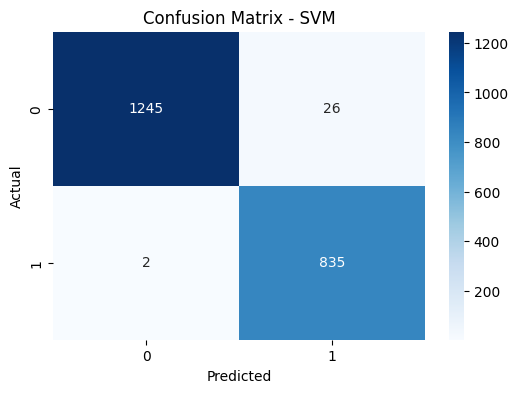


SVM Classification Report:
               precision    recall  f1-score   support

           0      0.998     0.980     0.989      1271
           1      0.970     0.998     0.984       837

    accuracy                          0.987      2108
   macro avg      0.984     0.989     0.986      2108
weighted avg      0.987     0.987     0.987      2108

Accuracy: 0.9867


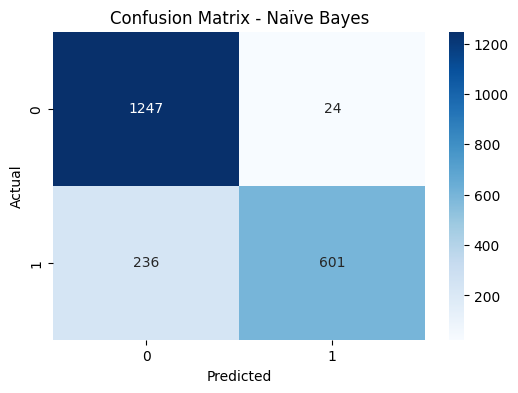


Naïve Bayes Classification Report:
               precision    recall  f1-score   support

           0      0.841     0.981     0.906      1271
           1      0.962     0.718     0.822       837

    accuracy                          0.877      2108
   macro avg      0.901     0.850     0.864      2108
weighted avg      0.889     0.877     0.872      2108

Accuracy: 0.8767


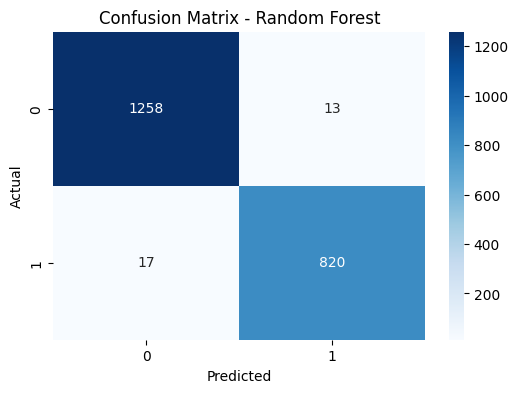


Random Forest Classification Report:
               precision    recall  f1-score   support

           0      0.987     0.990     0.988      1271
           1      0.984     0.980     0.982       837

    accuracy                          0.986      2108
   macro avg      0.986     0.985     0.985      2108
weighted avg      0.986     0.986     0.986      2108

Accuracy: 0.9858


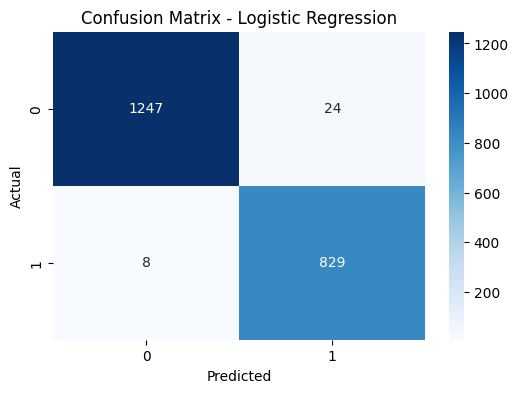


Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0      0.994     0.981     0.987      1271
           1      0.972     0.990     0.981       837

    accuracy                          0.985      2108
   macro avg      0.983     0.986     0.984      2108
weighted avg      0.985     0.985     0.985      2108

Accuracy: 0.9848


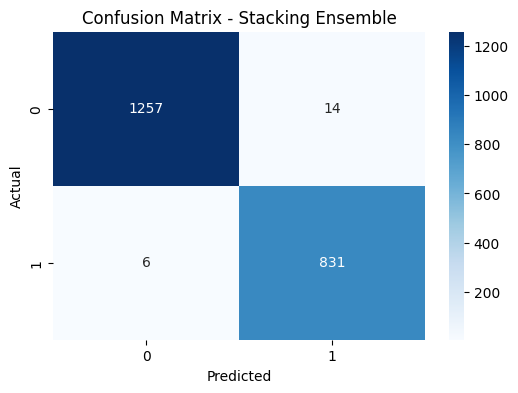


Stacking Ensemble Classification Report:
               precision    recall  f1-score   support

           0      0.995     0.989     0.992      1271
           1      0.983     0.993     0.988       837

    accuracy                          0.991      2108
   macro avg      0.989     0.991     0.990      2108
weighted avg      0.991     0.991     0.991      2108

Stacking Ensemble Accuracy: 0.9905


In [ ]:
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Inisialisasi Base Learners (Tidak Dilatih Dulu!)
svm_clf = SVC(kernel='rbf', probability=True, random_state=42)
nb_clf = MultinomialNB()
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
lr_clf = LogisticRegression(random_state=42)

# Evaluasi Model Individu
models = {
    'SVM': svm_clf,
    'Naïve Bayes': nb_clf,
    'Random Forest': rf_clf,
    'Logistic Regression': lr_clf
}

def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(title)
    plt.show()

# Latih dan Evaluasi Model Individu
for name, model in models.items():
    model.fit(X_train, Y_train)
    Y_pred = model.predict(X_test)
    plot_confusion_matrix(Y_test, Y_pred, f'Confusion Matrix - {name}')
    print(f'\n{name} Classification Report:\n', classification_report(Y_test, Y_pred, digits=3))
    print(f'Accuracy: {accuracy_score(Y_test, Y_pred):.4f}')

# **Stacking Ensemble (Gunakan Model Baru, Tidak dari Training Sebelumnya!)**
base_learners = [
    ('svm', SVC(kernel='rbf', probability=True, random_state=42, class_weight="balanced")),
    ('naive_bayes', MultinomialNB()),
    ('random_forest', RandomForestClassifier(n_estimators=100, random_state=42, class_weight="balanced"))
]
meta_learner = LogisticRegression(random_state=42, class_weight="balanced")

stacking_clf_transaksi = StackingClassifier(estimators=base_learners, final_estimator=meta_learner, passthrough=False, cv=5)

# Latih dan Evaluasi Stacking
stacking_clf_transaksi.fit(X_train, Y_train)
Y_pred_stack = stacking_clf_transaksi.predict(X_test)

plot_confusion_matrix(Y_test, Y_pred_stack, 'Confusion Matrix - Stacking Ensemble')
print('\nStacking Ensemble Classification Report:\n', classification_report(Y_test, Y_pred_stack, digits=3))
print(f'Stacking Ensemble Accuracy: {accuracy_score(Y_test, Y_pred_stack):.4f}')


**SMOTE TRANSAKSI**

In [ ]:
from imblearn.over_sampling import SMOTE
import numpy as np


from sklearn.model_selection import train_test_split

# Menampilkan jumlah data sebelum SMOTE
unique, counts = np.unique(Y_train, return_counts=True)
print("Jumlah data sebelum SMOTE:")
for cls, count in zip(unique, counts):
    print(f'Kelas {cls}: {count}')

# Menyeimbangkan Data dengan SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, Y_train_resampled = smote.fit_resample(X_train, Y_train)

# Menampilkan jumlah data setelah SMOTE
unique_resampled, counts_resampled = np.unique(Y_train_resampled, return_counts=True)
print("\nJumlah data setelah SMOTE:")
for cls, count in zip(unique_resampled, counts_resampled):
    print(f'Kelas {cls}: {count}')

Jumlah data sebelum SMOTE:
Kelas 0: 4959
Kelas 1: 3471

Jumlah data setelah SMOTE:
Kelas 0: 4959
Kelas 1: 4959


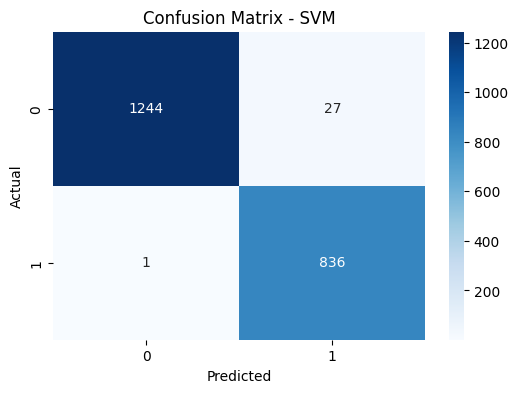


SVM Classification Report:
               precision    recall  f1-score   support

           0      0.999     0.979     0.989      1271
           1      0.969     0.999     0.984       837

    accuracy                          0.987      2108
   macro avg      0.984     0.989     0.986      2108
weighted avg      0.987     0.987     0.987      2108

Accuracy: 0.9867


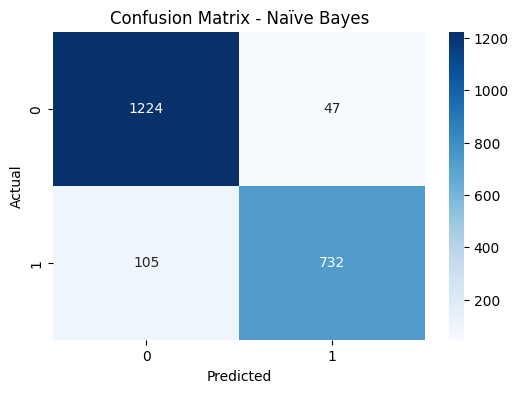


Naïve Bayes Classification Report:
               precision    recall  f1-score   support

           0      0.921     0.963     0.942      1271
           1      0.940     0.875     0.906       837

    accuracy                          0.928      2108
   macro avg      0.930     0.919     0.924      2108
weighted avg      0.928     0.928     0.927      2108

Accuracy: 0.9279


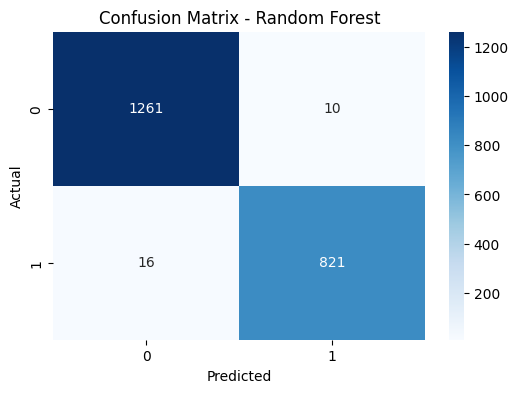


Random Forest Classification Report:
               precision    recall  f1-score   support

           0      0.987     0.992     0.990      1271
           1      0.988     0.981     0.984       837

    accuracy                          0.988      2108
   macro avg      0.988     0.987     0.987      2108
weighted avg      0.988     0.988     0.988      2108

Accuracy: 0.9877


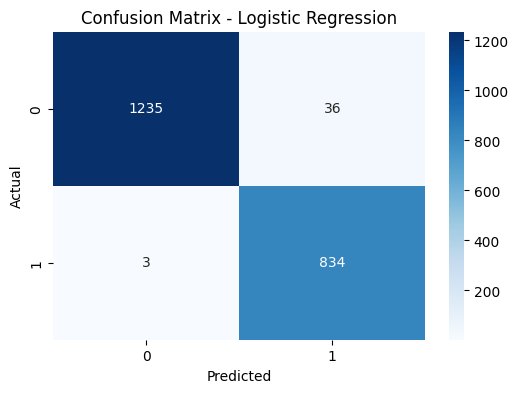


Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0      0.998     0.972     0.984      1271
           1      0.959     0.996     0.977       837

    accuracy                          0.981      2108
   macro avg      0.978     0.984     0.981      2108
weighted avg      0.982     0.981     0.982      2108

Accuracy: 0.9815


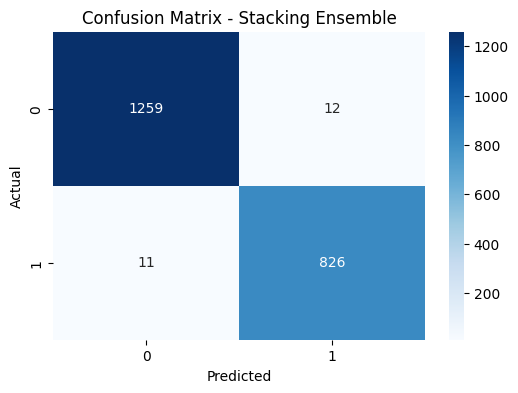


Stacking Ensemble Classification Report:
               precision    recall  f1-score   support

           0      0.991     0.991     0.991      1271
           1      0.986     0.987     0.986       837

    accuracy                          0.989      2108
   macro avg      0.989     0.989     0.989      2108
weighted avg      0.989     0.989     0.989      2108

Stacking Ensemble Accuracy: 0.9891


In [ ]:
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Inisialisasi Base Learners (Tidak Dilatih Dulu!)
svm_clf = SVC(kernel='rbf', probability=True, random_state=42)
nb_clf = MultinomialNB()
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
lr_clf = LogisticRegression(random_state=42)

# Evaluasi Model Individu
models = {
    'SVM': svm_clf,
    'Naïve Bayes': nb_clf,
    'Random Forest': rf_clf,
    'Logistic Regression': lr_clf
}

def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(title)
    plt.show()

# Latih dan Evaluasi Model Individu
for name, model in models.items():
    model.fit(X_train_resampled, Y_train_resampled)
    Y_pred = model.predict(X_test)
    plot_confusion_matrix(Y_test, Y_pred, f'Confusion Matrix - {name}')
    print(f'\n{name} Classification Report:\n', classification_report(Y_test, Y_pred, digits=3))
    print(f'Accuracy: {accuracy_score(Y_test, Y_pred):.4f}')

# **Stacking Ensemble (Gunakan Model Baru, Tidak dari Training Sebelumnya!)**
base_learners = [
    ('svm', SVC(kernel='rbf', probability=True, random_state=42)),
    ('naive_bayes', MultinomialNB()),
    ('random_forest', RandomForestClassifier(n_estimators=100, random_state=42))
]
meta_learner = LogisticRegression(random_state=42)

stacking_clf = StackingClassifier(estimators=base_learners, final_estimator=meta_learner, passthrough=False, cv=5)

# Latih dan Evaluasi Stacking
stacking_clf.fit(X_train_resampled, Y_train_resampled)
Y_pred_stack = stacking_clf.predict(X_test)

plot_confusion_matrix(Y_test, Y_pred_stack, 'Confusion Matrix - Stacking Ensemble')
print('\nStacking Ensemble Classification Report:\n', classification_report(Y_test, Y_pred_stack, digits=3))
print(f'Stacking Ensemble Accuracy: {accuracy_score(Y_test, Y_pred_stack):.4f}')


**SENTIMEN TIAP ASPEK**

**Sentimen Tampilan**

In [ ]:
import pandas as pd
import numpy as np

df_dataset = pd.read_csv('/content/Pembagian Aspek - Tampilan.csv')
df_dataset


,content,sentimen,aspek,content_clean,content_casefolded,content_normalized,content_stopword,content_tokens,clean_text,content_stemmed
0,LEBIH simpel BNI MOBILE. MAKSUDNYA APA YAH nas...,Negative,Tampilan,LEBIH simpel BNI MOBILE MAKSUDNYA APA YAH nasa...,lebih simpel bni mobile maksudnya apa yah nasa...,lebih simpel bni mobile maksudnya apa ya nasab...,lebih simpel mobile maksudnya nasabah suruh mi...,"['lebih', 'simpel', 'mobile', 'maksudnya', 'na...",lebih simpel mobile maksudnya nasabah suruh mi...,"['lebih', 'simpel', 'mobile', 'maksud', 'nasab..."
1,Lebih simpel dari aplikasi BNI sebelumnya,Positive,Tampilan,Lebih simpel dari aplikasi BNI sebelumnya,lebih simpel dari aplikasi bni sebelumnya,lebih simpel dari aplikasi bni sebelumnya,lebih simpel,"['lebih', 'simpel']",lebih simpel,"['lebih', 'simpel']"
2,"Wah, notifikasi terkait konfirmasi transaksi l...",Positive,Tampilan,Wah notifikasi terkait konfirmasi transaksi la...,wah notifikasi terkait konfirmasi transaksi la...,wah notifikasi terkait konfirmasi transaksi la...,notifikasi terkait konfirmasi transaksi lama k...,"['notifikasi', 'terkait', 'konfirmasi', 'trans...",notifikasi terkait konfirmasi transaksi lama k...,"['notifikasi', 'kait', 'konfirmasi', 'transaks..."
3,"Lebih simpel fiturÂ² nya, tapi belum ada fitur...",Positive,Tampilan,Lebih simpel fitur nya tapi belum ada fitur ta...,lebih simpel fitur nya tapi belum ada fitur ta...,lebih simpel fitur ya tapi belum ada fitur tar...,lebih simpel fitur belum fitur tarik tunai lan...,"['lebih', 'simpel', 'fitur', 'belum', 'fitur',...",lebih simpel fitur belum fitur tarik tunai lan...,"['lebih', 'simpel', 'fitur', 'belum', 'fitur',..."
4,Keren Sih tapi gak ada bonus nya,Positive,Tampilan,Keren Sih tapi gak ada bonus nya,keren sih tapi gak ada bonus nya,keren sih tapi tidak ada bonus ya,keren sih tidak bonus,"['keren', 'sih', 'tidak', 'bonus']",keren sih tidak bonus,"['keren', 'sih', 'tidak', 'bonus']"
...,...,...,...,...,...,...,...,...,...,...
3520,"Mantap tambah simpel dan mudah di gunakan, man...",Positive,Tampilan,Mantap tambah simpel dan mudah di gunakan mant...,mantap tambah simpel dan mudah di gunakan mant...,mantap tambah simpel dan mudah di gunakan mant...,mantap simpel mudah mantap,"['mantap', 'simpel', 'mudah', 'mantap']",mantap simpel mudah mantap,"['mantap', 'simpel', 'mudah', 'mantap']"
3521,"Lebih simpel saat bertransaksi, ga banyak yg d...",Positive,Tampilan,Lebih simpel saat bertransaksi ga banyak yg di...,lebih simpel saat bertransaksi ga banyak yg di...,lebih simpel saat bertransaksi tidak banyak ya...,lebih simpel bertransaksi tidak diisi enak ban...,"['lebih', 'simpel', 'bertransaksi', 'tidak', '...",lebih simpel bertransaksi tidak diisi enak ban...,"['lebih', 'simpel', 'transaksi', 'tidak', 'isi..."
3522,Baru banget cobain transaksi qris dan topup ew...,Positive,Tampilan,Baru banget cobain transaksi qris dan topup ew...,baru banget cobain transaksi qris dan topup ew...,baru saja banget mencoba transaksi QRIS dan to...,banget mencoba transaksi QRIS top up ewallet s...,"['banget', 'mencoba', 'transaksi', 'QRIS', 'to...",banget mencoba transaksi QRIS top up ewallet s...,"['banget', 'coba', 'transaksi', 'qris', 'top',..."
3523,Lebih simple dan praktis digunakan serta punya...,Positive,Tampilan,Lebih simple dan praktis digunakan serta punya...,lebih simple dan praktis digunakan serta punya...,lebih simpel dan praktis digunakan serta punya...,lebih simpel praktis fitur transaksi keuangan ...,"['lebih', 'simpel', 'praktis', 'fitur', 'trans...",lebih simpel praktis fitur transaksi keuangan ...,"['lebih', 'simpel', 'praktis', 'fitur', 'trans..."


In [ ]:
# Salin data untuk menghindari SettingWithCopyWarning
df_sen_tampilan = df_dataset[['content_stemmed', 'sentimen']].copy()

# Encoding label: 0 untuk Positif, 1 untuk Negatif
label_mapping = {'Positive': 0, 'Negative': 1}
df_sen_tampilan.loc[:, 'sentimen_encoded'] = df_sen_tampilan['sentimen'].map(label_mapping)


In [ ]:
df_sen_tampilan

,content_stemmed,sentimen,sentimen_encoded
0,"['lebih', 'simpel', 'mobile', 'maksud', 'nasab...",Negative,1
1,"['lebih', 'simpel']",Positive,0
2,"['notifikasi', 'kait', 'konfirmasi', 'transaks...",Positive,0
3,"['lebih', 'simpel', 'fitur', 'belum', 'fitur',...",Positive,0
4,"['keren', 'sih', 'tidak', 'bonus']",Positive,0
...,...,...,...
3520,"['mantap', 'simpel', 'mudah', 'mantap']",Positive,0
3521,"['lebih', 'simpel', 'transaksi', 'tidak', 'isi...",Positive,0
3522,"['banget', 'coba', 'transaksi', 'qris', 'top',...",Positive,0
3523,"['lebih', 'simpel', 'praktis', 'fitur', 'trans...",Positive,0


In [ ]:
# Step 1: TF-IDF Vectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer_sen_tampilan = TfidfVectorizer()
X_tfidf = vectorizer_sen_tampilan.fit_transform(df_sen_tampilan['content_stemmed'])  # Mengubah teks menjadi fitur numerik
Y = df_sen_tampilan['sentimen_encoded']  # Menggunakan label yang sudah di-encode (0: positif, 1: negatif)

In [ ]:
from sklearn.model_selection import train_test_split

# Step 2: Membagi Data Menjadi Data Latih dan Data Uji
X_train, X_test, Y_train, Y_test = train_test_split(X_tfidf, Y, test_size=0.2, random_state=42)

In [ ]:
from imblearn.over_sampling import SMOTE
import numpy as np


from sklearn.model_selection import train_test_split

# Menampilkan jumlah data sebelum SMOTE
unique, counts = np.unique(Y_train, return_counts=True)
print("Jumlah data sebelum SMOTE:")
for cls, count in zip(unique, counts):
    print(f'Kelas {cls}: {count}')


Jumlah data sebelum SMOTE:
Kelas 0: 2691
Kelas 1: 129


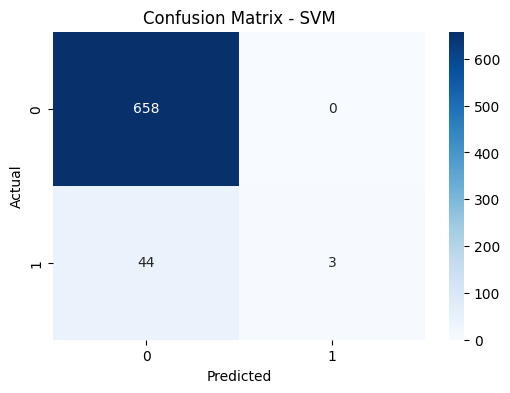


SVM Classification Report:
               precision    recall  f1-score   support

           0      0.937     1.000     0.968       658
           1      1.000     0.064     0.120        47

    accuracy                          0.938       705
   macro avg      0.969     0.532     0.544       705
weighted avg      0.942     0.938     0.911       705

Accuracy: 0.9376


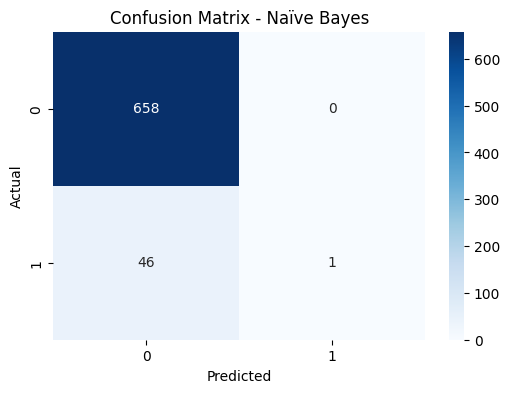


Naïve Bayes Classification Report:
               precision    recall  f1-score   support

           0      0.935     1.000     0.966       658
           1      1.000     0.021     0.042        47

    accuracy                          0.935       705
   macro avg      0.967     0.511     0.504       705
weighted avg      0.939     0.935     0.905       705

Accuracy: 0.9348


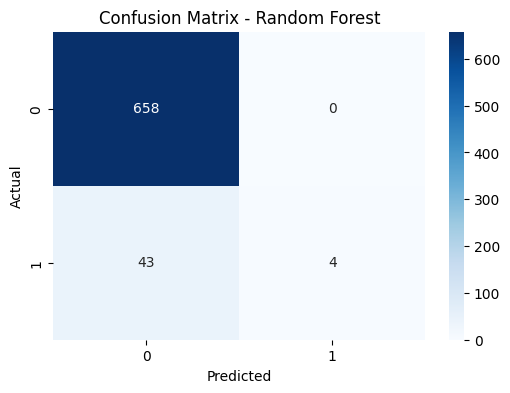


Random Forest Classification Report:
               precision    recall  f1-score   support

           0      0.939     1.000     0.968       658
           1      1.000     0.085     0.157        47

    accuracy                          0.939       705
   macro avg      0.969     0.543     0.563       705
weighted avg      0.943     0.939     0.914       705

Accuracy: 0.9390


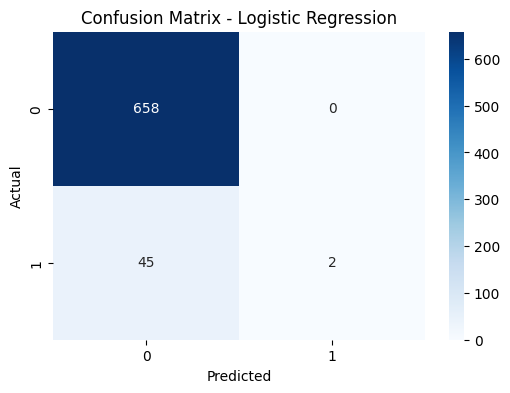


Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0      0.936     1.000     0.967       658
           1      1.000     0.043     0.082        47

    accuracy                          0.936       705
   macro avg      0.968     0.521     0.524       705
weighted avg      0.940     0.936     0.908       705

Accuracy: 0.9362


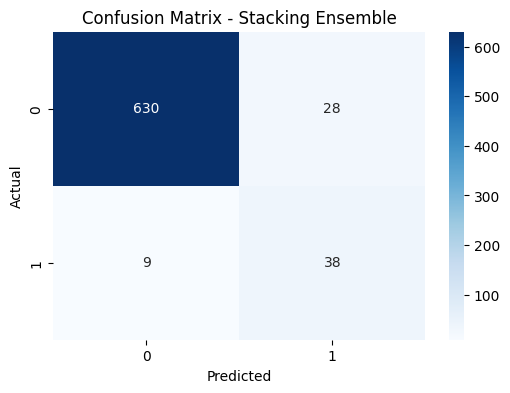


Stacking Ensemble Classification Report:
               precision    recall  f1-score   support

           0      0.986     0.957     0.971       658
           1      0.576     0.809     0.673        47

    accuracy                          0.948       705
   macro avg      0.781     0.883     0.822       705
weighted avg      0.959     0.948     0.952       705

Stacking Ensemble Accuracy: 0.9475


In [ ]:
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt


# Inisialisasi Base Learners (Tidak Dilatih Dulu!)
svm_clf = SVC(kernel='rbf', probability=True, random_state=42)
nb_clf = MultinomialNB()
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
lr_clf = LogisticRegression(random_state=42)

# Evaluasi Model Individu
models = {
    'SVM': svm_clf,
    'Naïve Bayes': nb_clf,
    'Random Forest': rf_clf,
    'Logistic Regression': lr_clf
}

def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(title)
    plt.show()

# Latih dan Evaluasi Model Individu
for name, model in models.items():
    model.fit(X_train, Y_train)
    Y_pred = model.predict(X_test)
    plot_confusion_matrix(Y_test, Y_pred, f'Confusion Matrix - {name}')
    print(f'\n{name} Classification Report:\n', classification_report(Y_test, Y_pred, digits=3))
    print(f'Accuracy: {accuracy_score(Y_test, Y_pred):.4f}')

# **Stacking Ensemble (Gunakan Model Baru, Tidak dari Training Sebelumnya!)**
base_learners = [
    ('svm', SVC(kernel='rbf', probability=True, random_state=42, class_weight="balanced")),
    ('naive_bayes', MultinomialNB()),
    ('random_forest', RandomForestClassifier(n_estimators=100, random_state=42, class_weight="balanced"))
]
meta_learner = LogisticRegression(random_state=42, class_weight="balanced")

stacking_clf_sen_tampilan = StackingClassifier(estimators=base_learners, final_estimator=meta_learner, passthrough=False, cv=5)

# Latih dan Evaluasi Stacking
stacking_clf_sen_tampilan.fit(X_train, Y_train)
Y_pred_stack = stacking_clf_sen_tampilan.predict(X_test)

plot_confusion_matrix(Y_test, Y_pred_stack, 'Confusion Matrix - Stacking Ensemble')
print('\nStacking Ensemble Classification Report:\n', classification_report(Y_test, Y_pred_stack, digits=3))
print(f'Stacking Ensemble Accuracy: {accuracy_score(Y_test, Y_pred_stack):.4f}')


**SMOTE SENTIMEN TAMPILAN**

In [ ]:
from imblearn.over_sampling import SMOTE
import numpy as np


from sklearn.model_selection import train_test_split

# Menampilkan jumlah data sebelum SMOTE
unique, counts = np.unique(Y_train, return_counts=True)
print("Jumlah data sebelum SMOTE:")
for cls, count in zip(unique, counts):
    print(f'Kelas {cls}: {count}')

# Menyeimbangkan Data dengan SMOTE
smote = SMOTE( random_state=42)
X_train_resampled, Y_train_resampled = smote.fit_resample(X_train, Y_train)

# Menampilkan jumlah data setelah SMOTE
unique_resampled, counts_resampled = np.unique(Y_train_resampled, return_counts=True)
print("\nJumlah data setelah SMOTE:")
for cls, count in zip(unique_resampled, counts_resampled):
    print(f'Kelas {cls}: {count}')

Jumlah data sebelum SMOTE:
Kelas 0: 2691
Kelas 1: 129

Jumlah data setelah SMOTE:
Kelas 0: 2691
Kelas 1: 2691


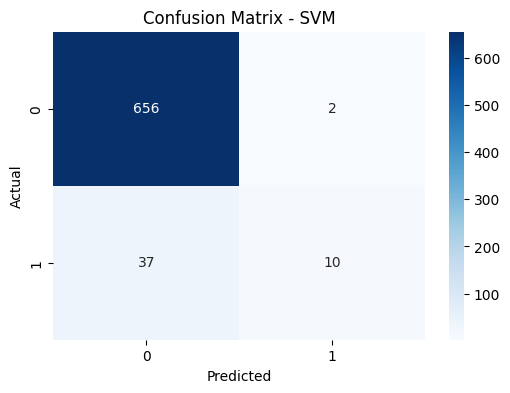


SVM Classification Report:
               precision    recall  f1-score   support

           0      0.947     0.997     0.971       658
           1      0.833     0.213     0.339        47

    accuracy                          0.945       705
   macro avg      0.890     0.605     0.655       705
weighted avg      0.939     0.945     0.929       705

Accuracy: 0.9447


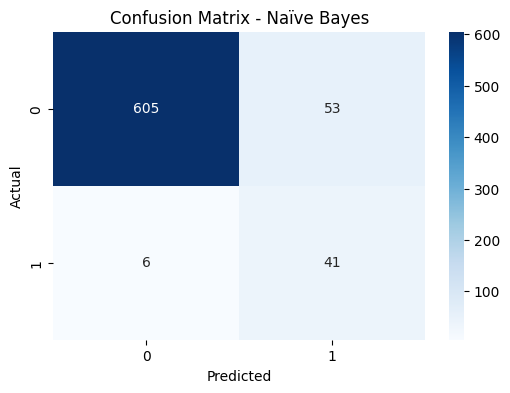


Naïve Bayes Classification Report:
               precision    recall  f1-score   support

           0      0.990     0.919     0.954       658
           1      0.436     0.872     0.582        47

    accuracy                          0.916       705
   macro avg      0.713     0.896     0.768       705
weighted avg      0.953     0.916     0.929       705

Accuracy: 0.9163


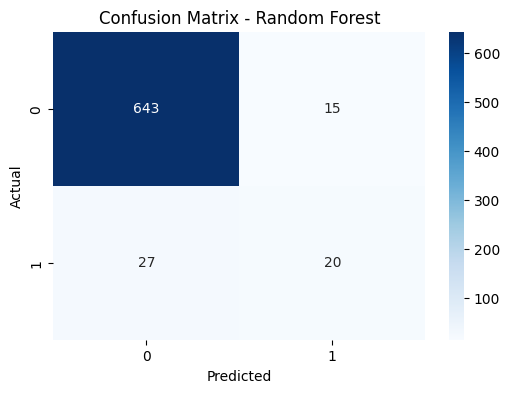


Random Forest Classification Report:
               precision    recall  f1-score   support

           0      0.960     0.977     0.968       658
           1      0.571     0.426     0.488        47

    accuracy                          0.940       705
   macro avg      0.766     0.701     0.728       705
weighted avg      0.934     0.940     0.936       705

Accuracy: 0.9404


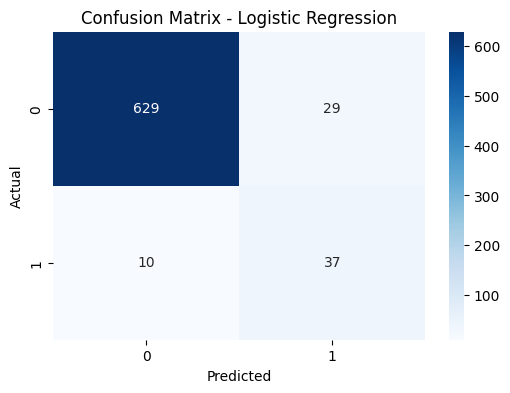


Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0      0.984     0.956     0.970       658
           1      0.561     0.787     0.655        47

    accuracy                          0.945       705
   macro avg      0.772     0.872     0.812       705
weighted avg      0.956     0.945     0.949       705

Accuracy: 0.9447


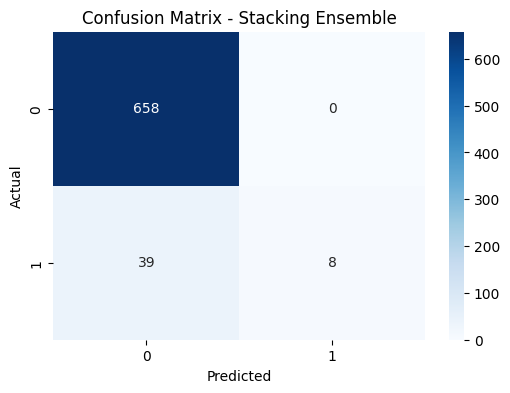


Stacking Ensemble Classification Report:
               precision    recall  f1-score   support

           0      0.944     1.000     0.971       658
           1      1.000     0.170     0.291        47

    accuracy                          0.945       705
   macro avg      0.972     0.585     0.631       705
weighted avg      0.948     0.945     0.926       705

Stacking Ensemble Accuracy: 0.9447


In [ ]:
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt


# Inisialisasi Base Learners (Tidak Dilatih Dulu!)
svm_clf = SVC(kernel='rbf', probability=True, random_state=42)
nb_clf = MultinomialNB()
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
lr_clf = LogisticRegression(random_state=42)

# Evaluasi Model Individu
models = {
    'SVM': svm_clf,
    'Naïve Bayes': nb_clf,
    'Random Forest': rf_clf,
    'Logistic Regression': lr_clf
}

def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(title)
    plt.show()

# Latih dan Evaluasi Model Individu
for name, model in models.items():
    model.fit(X_train_resampled, Y_train_resampled)
    Y_pred = model.predict(X_test)
    plot_confusion_matrix(Y_test, Y_pred, f'Confusion Matrix - {name}')
    print(f'\n{name} Classification Report:\n', classification_report(Y_test, Y_pred, digits=3))
    print(f'Accuracy: {accuracy_score(Y_test, Y_pred):.4f}')

# **Stacking Ensemble (Gunakan Model Baru, Tidak dari Training Sebelumnya!)**
base_learners = [
    ('svm', SVC(kernel='rbf', probability=True, random_state=42, class_weight="balanced")),
    ('naive_bayes', MultinomialNB()),
    ('random_forest', RandomForestClassifier(n_estimators=100, random_state=42, class_weight="balanced"))
]
meta_learner = LogisticRegression(random_state=42, class_weight="balanced")

stacking_clf = StackingClassifier(estimators=base_learners, final_estimator=meta_learner, passthrough=True,
    stack_method='predict_proba' )

# Latih dan Evaluasi Stacking
stacking_clf.fit(X_train_resampled, Y_train_resampled)
Y_pred_stack = stacking_clf.predict(X_test)

plot_confusion_matrix(Y_test, Y_pred_stack, 'Confusion Matrix - Stacking Ensemble')
print('\nStacking Ensemble Classification Report:\n', classification_report(Y_test, Y_pred_stack, digits=3))
print(f'Stacking Ensemble Accuracy: {accuracy_score(Y_test, Y_pred_stack):.4f}')


**SENTIMEN AUTENTIKASI**

In [ ]:
import pandas as pd
import numpy as np

df_dataset = pd.read_csv('/content/Pembagian Aspek - Autentikasi.csv')
df_dataset



,content,sentimen,aspek,content_clean,content_casefolded,content_normalized,content_stopword,content_tokens,clean_text,content_stemmed
0,"daftarin ortu,verifikasi wajah gagal terus, ja...",Negative,Autentikasi,daftarin ortu verifikasi wajah gagal terus jad...,daftarin ortu verifikasi wajah gagal terus jad...,daftarin orang tua verifikasi wajah gagal teru...,daftarin orang tua verifikasi wajah gagal limi...,"['daftarin', 'orang', 'tua', 'verifikasi', 'wa...",daftarin orang tua verifikasi wajah gagal limi...,"['daftarin', 'orang', 'tua', 'verifikasi', 'wa..."
1,"Mau Instal, verifikasi gagal terus,ribet susah...",Negative,Autentikasi,Mau Instal verifikasi gagal terus ribet susah,mau instal verifikasi gagal terus ribet susah,mau install verifikasi gagal terus rumit susah,install verifikasi gagal rumit susah,"['install', 'verifikasi', 'gagal', 'rumit', 's...",install verifikasi gagal rumit susah,"['install', 'verifikasi', 'gagal', 'rumit', 's..."
2,Verifikasi email sampai 1 jam kok gak di kirim...,Negative,Autentikasi,Verifikasi email sampai jam kok gak di kirim ...,verifikasi email sampai jam kok gak di kirim ...,verifikasi email sampai jam kok tidak di kirim...,verifikasi email jam tidak kirim kodenya ulang...,"['verifikasi', 'email', 'jam', 'tidak', 'kirim...",verifikasi email jam tidak kirim kodenya ulang...,"['verifikasi', 'email', 'jam', 'tidak', 'kirim..."
3,Mau download BNI mobile banking gaboleh suruh ...,Negative,Autentikasi,Mau download BNI mobile banking gaboleh suruh ...,mau download bni mobile banking gaboleh suruh ...,mau download bni mobile banking tidak boleh su...,download mobile banking tidak suruh satpam sur...,"['download', 'mobile', 'banking', 'tidak', 'su...",download mobile banking tidak suruh satpam sur...,"['download', 'mobile', 'banking', 'tidak', 'su..."
4,"Gabisa di buka, tulisannya tidak bisa mendafta...",Negative,Autentikasi,Gabisa di buka tulisannya tidak bisa mendaftar...,gabisa di buka tulisannya tidak bisa mendaftar...,tidak bisa di buka tulisannya tidak bisa menda...,tidak bisa buka tulisannya tidak bisa mendafta...,"['tidak', 'bisa', 'buka', 'tulisannya', 'tidak...",tidak bisa buka tulisannya tidak bisa mendafta...,"['tidak', 'bisa', 'buka', 'tulis', 'tidak', 'b..."
...,...,...,...,...,...,...,...,...,...,...
2678,System error terus saat mau verifikasi wajah,Negative,Autentikasi,System error terus saat mau verifikasi wajah,system error terus saat mau verifikasi wajah,system error terus saat mau verifikasi wajah,system error verifikasi wajah,"['system', 'error', 'verifikasi', 'wajah']",system error verifikasi wajah,"['system', 'error', 'verifikasi', 'wajah']"
2679,"Aplikasi aneh, masa nomor HP yg dimasukkan ter...",Negative,Autentikasi,Aplikasi aneh masa nomor HP yg dimasukkan tert...,aplikasi aneh masa nomor hp yg dimasukkan tert...,aplikasi aneh masa nomor hp yang dimasukkan te...,aneh nomor hp dimasukkan tertulis tidak tedaft...,"['aneh', 'nomor', 'hp', 'dimasukkan', 'tertuli...",aneh nomor hp dimasukkan tertulis tidak tedaft...,"['aneh', 'nomor', 'hp', 'masuk', 'tulis', 'tid..."
2680,"Verifikasi muka nya sangat membingungkan, serb...",Negative,Autentikasi,Verifikasi muka nya sangat membingungkan serba...,verifikasi muka nya sangat membingungkan serba...,verifikasi muka ya sangat membingungkan serba ...,verifikasi muka sangat membingungkan serba sal...,"['verifikasi', 'muka', 'sangat', 'membingungka...",verifikasi muka sangat membingungkan serba sal...,"['verifikasi', 'muka', 'sangat', 'bingung', 's..."
2681,"Keren bangett tampilannya fancy, lebih mudah d...",Positive,Autentikasi,Keren bangett tampilannya fancy lebih mudah di...,keren bangett tampilannya fancy lebih mudah di...,keren banget tampilannya fancy lebih mudah dig...,keren banget tampilannya fancy lebih mudah qri...,"['keren', 'banget', 'tampilannya', 'fancy', 'l...",keren banget tampilannya fancy lebih mudah qri...,"['keren', 'banget', 'tampil', 'fancy', 'lebih'..."


In [ ]:
# Salin data untuk menghindari SettingWithCopyWarning
df_sen_autentikasi = df_dataset[['content_stemmed', 'sentimen']].copy()

# Encoding label: 0 untuk Positif, 1 untuk Negatif
label_mapping = {'Positive': 0, 'Negative': 1}
df_sen_autentikasi.loc[:, 'sentimen_encoded'] = df_sen_autentikasi['sentimen'].map(label_mapping)


In [ ]:
df_sen_autentikasi

,content_stemmed,sentimen,sentimen_encoded
0,"['daftarin', 'orang', 'tua', 'verifikasi', 'wa...",Negative,1
1,"['install', 'verifikasi', 'gagal', 'rumit', 's...",Negative,1
2,"['verifikasi', 'email', 'jam', 'tidak', 'kirim...",Negative,1
3,"['download', 'mobile', 'banking', 'tidak', 'su...",Negative,1
4,"['tidak', 'bisa', 'buka', 'tulis', 'tidak', 'b...",Negative,1
...,...,...,...
2678,"['system', 'error', 'verifikasi', 'wajah']",Negative,1
2679,"['aneh', 'nomor', 'hp', 'masuk', 'tulis', 'tid...",Negative,1
2680,"['verifikasi', 'muka', 'sangat', 'bingung', 's...",Negative,1
2681,"['keren', 'banget', 'tampil', 'fancy', 'lebih'...",Positive,0


In [ ]:
# Step 1: TF-IDF Vectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer_sen_autentikasi = TfidfVectorizer()
X_tfidf = vectorizer_sen_autentikasi.fit_transform(df_sen_autentikasi['content_stemmed'])  # Mengubah teks menjadi fitur numerik
Y = df_sen_autentikasi['sentimen_encoded']  # Menggunakan label yang sudah di-encode (0: positif, 1: negatif)

In [ ]:

from sklearn.model_selection import train_test_split

# Step 2: Membagi Data Menjadi Data Latih dan Data Uji
X_train, X_test, Y_train, Y_test = train_test_split(X_tfidf, Y, test_size=0.2, random_state=42)

from imblearn.over_sampling import SMOTE
import numpy as np


from sklearn.model_selection import train_test_split

# Menampilkan jumlah data sebelum SMOTE
unique, counts = np.unique(Y_train, return_counts=True)
print("Jumlah data sebelum SMOTE:")
for cls, count in zip(unique, counts):
    print(f'Kelas {cls}: {count}')



Jumlah data sebelum SMOTE:
Kelas 0: 185
Kelas 1: 1961


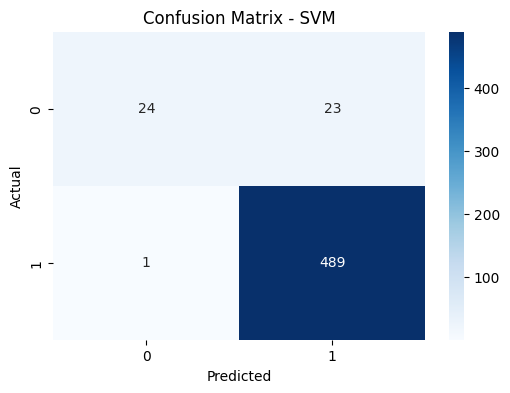


SVM Classification Report:
               precision    recall  f1-score   support

           0      0.960     0.511     0.667        47
           1      0.955     0.998     0.976       490

    accuracy                          0.955       537
   macro avg      0.958     0.754     0.821       537
weighted avg      0.956     0.955     0.949       537

Accuracy: 0.9553


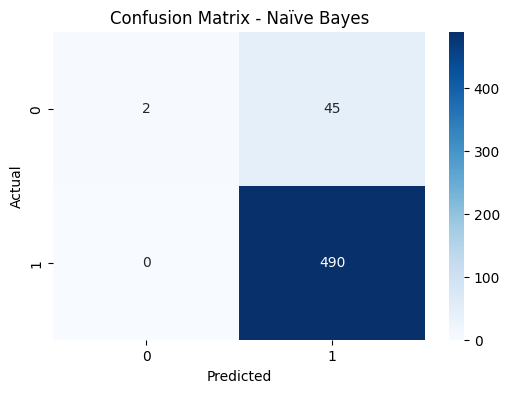


Naïve Bayes Classification Report:
               precision    recall  f1-score   support

           0      1.000     0.043     0.082        47
           1      0.916     1.000     0.956       490

    accuracy                          0.916       537
   macro avg      0.958     0.521     0.519       537
weighted avg      0.923     0.916     0.880       537

Accuracy: 0.9162


In [ ]:
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Inisialisasi Base Learners (Tidak Dilatih Dulu!)
svm_clf = SVC(kernel='rbf', probability=True, random_state=42)
nb_clf = MultinomialNB()
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
lr_clf = LogisticRegression(random_state=42)

# Evaluasi Model Individu
models = {
    'SVM': svm_clf,
    'Naïve Bayes': nb_clf,
    'Random Forest': rf_clf,
    'Logistic Regression': lr_clf
}

def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(title)
    plt.show()

# Latih dan Evaluasi Model Individu
for name, model in models.items():
    model.fit(X_train, Y_train)
    Y_pred = model.predict(X_test)
    plot_confusion_matrix(Y_test, Y_pred, f'Confusion Matrix - {name}')
    print(f'\n{name} Classification Report:\n', classification_report(Y_test, Y_pred, digits=3))
    print(f'Accuracy: {accuracy_score(Y_test, Y_pred):.4f}')

# **Stacking Ensemble (Gunakan Model Baru, Tidak dari Training Sebelumnya!)**
base_learners = [
    ('svm', SVC(kernel='rbf', probability=True, random_state=42, class_weight="balanced")),
    ('naive_bayes', MultinomialNB()),
    ('random_forest', RandomForestClassifier(n_estimators=100, random_state=42, class_weight="balanced"))
]
meta_learner = LogisticRegression(random_state=42)

stacking_clf_sen_autentikasi = StackingClassifier(estimators=base_learners, final_estimator=meta_learner, passthrough=False, cv=5)

# Latih dan Evaluasi Stacking
stacking_clf_sen_autentikasi.fit(X_train, Y_train)
Y_pred_stack = stacking_clf_sen_autentikasi.predict(X_test)

plot_confusion_matrix(Y_test, Y_pred_stack, 'Confusion Matrix - Stacking Ensemble')
print('\nStacking Ensemble Classification Report:\n', classification_report(Y_test, Y_pred_stack, digits=3))
print(f'Stacking Ensemble Accuracy: {accuracy_score(Y_test, Y_pred_stack):.4f}')

**SMOTE SENTIMEN AUTENTIKASI**

In [ ]:
from imblearn.over_sampling import SMOTE
import numpy as np


from sklearn.model_selection import train_test_split

# Menampilkan jumlah data sebelum SMOTE
unique, counts = np.unique(Y_train, return_counts=True)
print("Jumlah data sebelum SMOTE:")
for cls, count in zip(unique, counts):
    print(f'Kelas {cls}: {count}')

# Menyeimbangkan Data dengan SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, Y_train_resampled = smote.fit_resample(X_train, Y_train)

# Menampilkan jumlah data setelah SMOTE
unique_resampled, counts_resampled = np.unique(Y_train_resampled, return_counts=True)
print("\nJumlah data setelah SMOTE:")
for cls, count in zip(unique_resampled, counts_resampled):
    print(f'Kelas {cls}: {count}')

Jumlah data sebelum SMOTE:
Kelas 0: 201
Kelas 1: 1945

Jumlah data setelah SMOTE:
Kelas 0: 1945
Kelas 1: 1945


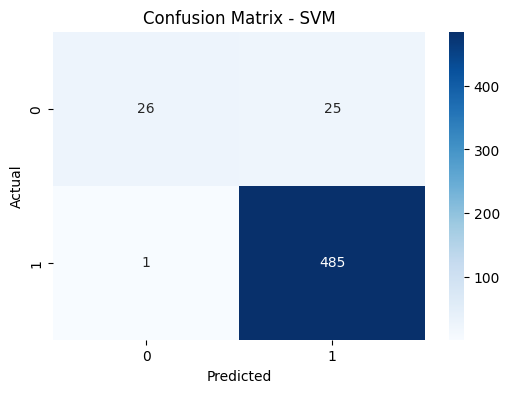


SVM Classification Report:
               precision    recall  f1-score   support

           0      0.963     0.510     0.667        51
           1      0.951     0.998     0.974       486

    accuracy                          0.952       537
   macro avg      0.957     0.754     0.820       537
weighted avg      0.952     0.952     0.945       537

Accuracy: 0.9516


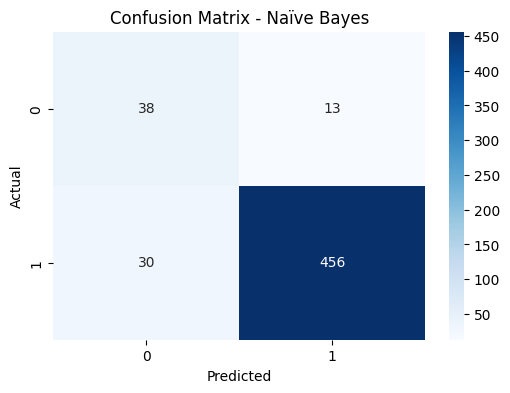


Naïve Bayes Classification Report:
               precision    recall  f1-score   support

           0      0.559     0.745     0.639        51
           1      0.972     0.938     0.955       486

    accuracy                          0.920       537
   macro avg      0.766     0.842     0.797       537
weighted avg      0.933     0.920     0.925       537

Accuracy: 0.9199


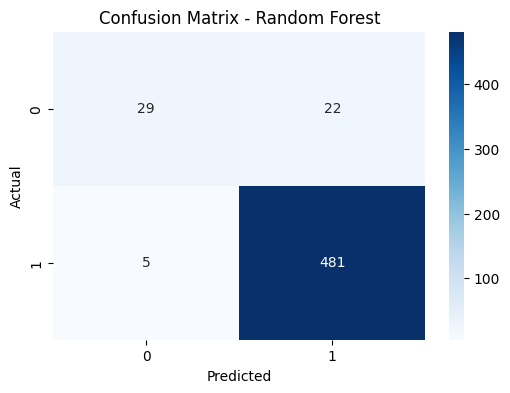


Random Forest Classification Report:
               precision    recall  f1-score   support

           0      0.853     0.569     0.682        51
           1      0.956     0.990     0.973       486

    accuracy                          0.950       537
   macro avg      0.905     0.779     0.828       537
weighted avg      0.946     0.950     0.945       537

Accuracy: 0.9497


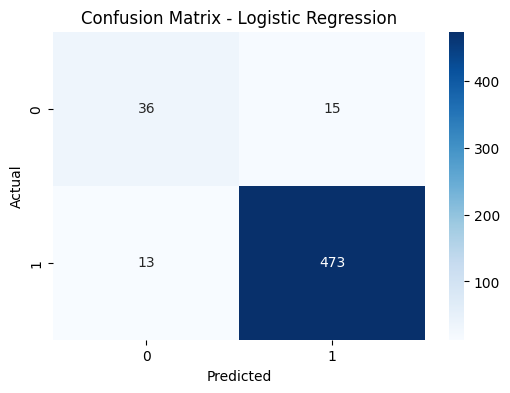


Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0      0.735     0.706     0.720        51
           1      0.969     0.973     0.971       486

    accuracy                          0.948       537
   macro avg      0.852     0.840     0.846       537
weighted avg      0.947     0.948     0.947       537

Accuracy: 0.9479


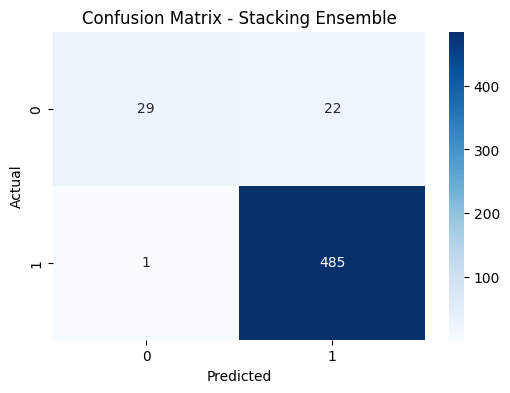


Stacking Ensemble Classification Report:
               precision    recall  f1-score   support

           0      0.967     0.569     0.716        51
           1      0.957     0.998     0.977       486

    accuracy                          0.957       537
   macro avg      0.962     0.783     0.846       537
weighted avg      0.958     0.957     0.952       537

Stacking Ensemble Accuracy: 0.9572


In [ ]:
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Inisialisasi Base Learners (Tidak Dilatih Dulu!)
svm_clf = SVC(kernel='rbf', probability=True, random_state=42)
nb_clf = MultinomialNB()
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
lr_clf = LogisticRegression(random_state=42)

# Evaluasi Model Individu
models = {
    'SVM': svm_clf,
    'Naïve Bayes': nb_clf,
    'Random Forest': rf_clf,
    'Logistic Regression': lr_clf
}

def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(title)
    plt.show()

# Latih dan Evaluasi Model Individu
for name, model in models.items():
    model.fit(X_train_resampled, Y_train_resampled)
    Y_pred = model.predict(X_test)
    plot_confusion_matrix(Y_test, Y_pred, f'Confusion Matrix - {name}')
    print(f'\n{name} Classification Report:\n', classification_report(Y_test, Y_pred, digits=3))
    print(f'Accuracy: {accuracy_score(Y_test, Y_pred):.4f}')

# **Stacking Ensemble (Gunakan Model Baru, Tidak dari Training Sebelumnya!)**
base_learners = [
    ('svm', SVC(kernel='rbf', probability=True, random_state=42)),
    ('naive_bayes', MultinomialNB()),
    ('random_forest', RandomForestClassifier(n_estimators=100, random_state=42))
]
meta_learner = LogisticRegression(random_state=42)

stacking_clf = StackingClassifier(estimators=base_learners, final_estimator=meta_learner, passthrough=False, cv=5)

# Latih dan Evaluasi Stacking
stacking_clf.fit(X_train_resampled, Y_train_resampled)
Y_pred_stack = stacking_clf.predict(X_test)

plot_confusion_matrix(Y_test, Y_pred_stack, 'Confusion Matrix - Stacking Ensemble')
print('\nStacking Ensemble Classification Report:\n', classification_report(Y_test, Y_pred_stack, digits=3))
print(f'Stacking Ensemble Accuracy: {accuracy_score(Y_test, Y_pred_stack):.4f}')

**SENTIMEN TRANSAKSI**

In [ ]:
import pandas as pd
import numpy as np

df_dataset = pd.read_csv('/content/Pembagian Aspek - Transaksi.csv')
df_dataset


,content,sentimen,aspek,content_clean,content_casefolded,content_normalized,content_stopword,content_tokens,clean_text,content_stemmed
0,"Wah, notifikasi terkait konfirmasi transaksi l...",Negative,Transaksi,Wah notifikasi terkait konfirmasi transaksi la...,wah notifikasi terkait konfirmasi transaksi la...,wah notifikasi terkait konfirmasi transaksi la...,notifikasi terkait konfirmasi transaksi lama k...,"['notifikasi', 'terkait', 'konfirmasi', 'trans...",notifikasi terkait konfirmasi transaksi lama k...,"['notifikasi', 'kait', 'konfirmasi', 'transaks..."
1,Mengapa memakai baras minimum jika ingin trans...,Negative,Transaksi,Mengapa memakai baras minimum jika ingin trans...,mengapa memakai baras minimum jika ingin trans...,mengapa memakai baras minimum jika ingin trans...,memakai baras minimum transaksi tidak memakai ...,"['memakai', 'baras', 'minimum', 'transaksi', '...",memakai baras minimum transaksi tidak memakai ...,"['pakai', 'baras', 'minimum', 'transaksi', 'ti..."
2,kok fitur notifikasi transaksi keluar masuk dl...,Negative,Transaksi,kok fitur notifikasi transaksi keluar masuk dl...,kok fitur notifikasi transaksi keluar masuk dl...,kok fitur notifikasi transaksi keluar masuk dl...,fitur notifikasi transaksi masuk dll tidak bis...,"['fitur', 'notifikasi', 'transaksi', 'masuk', ...",fitur notifikasi transaksi masuk dll tidak bis...,"['fitur', 'notifikasi', 'transaksi', 'masuk', ..."
3,"Gabisa di buka, tulisannya tidak bisa mendafta...",Negative,Transaksi,Gabisa di buka tulisannya tidak bisa mendaftar...,gabisa di buka tulisannya tidak bisa mendaftar...,tidak bisa di buka tulisannya tidak bisa menda...,tidak bisa buka tulisannya tidak bisa mendafta...,"['tidak', 'bisa', 'buka', 'tulisannya', 'tidak...",tidak bisa buka tulisannya tidak bisa mendafta...,"['tidak', 'bisa', 'buka', 'tulis', 'tidak', 'b..."
4,Aplikasi yg bagus.mempermudah semua transaksi....,Positive,Transaksi,Aplikasi yg bagus mempermudah semua transaksi,aplikasi yg bagus mempermudah semua transaksi,aplikasi yang bagus mempermudah semua transaksi,bagus mempermudah transaksi,"['bagus', 'mempermudah', 'transaksi']",bagus mempermudah transaksi,"['bagus', 'mudah', 'transaksi']"
...,...,...,...,...,...,...,...,...,...,...
6225,Transaksi sat set ga pake lama love love wondr...,Positive,Transaksi,Transaksi sat set ga pake lama love love wondr,transaksi sat set ga pake lama love love wondr,transaksi sat set tidak pakai lama love love w...,transaksi sat set tidak pakai lama love love,"['transaksi', 'sat', 'set', 'tidak', 'pakai', ...",transaksi sat set tidak pakai lama love love,"['transaksi', 'sat', 'set', 'tidak', 'pakai', ..."
6226,Lebih simple dan praktis digunakan serta punya...,Positive,Transaksi,Lebih simple dan praktis digunakan serta punya...,lebih simple dan praktis digunakan serta punya...,lebih simpel dan praktis digunakan serta punya...,lebih simpel praktis fitur transaksi keuangan ...,"['lebih', 'simpel', 'praktis', 'fitur', 'trans...",lebih simpel praktis fitur transaksi keuangan ...,"['lebih', 'simpel', 'praktis', 'fitur', 'trans..."
6227,Error terus mau transfer padahal belum mencapa...,Negative,Transaksi,Error terus mau transfer padahal belum mencapa...,error terus mau transfer padahal belum mencapa...,error terus mau transfer padahal belum mencapa...,error transfer belum mencapai limit transfer j...,"['error', 'transfer', 'belum', 'mencapai', 'li...",error transfer belum mencapai limit transfer j...,"['error', 'transfer', 'belum', 'capai', 'limit..."
6228,Kalo bayar bayar sekarang pake wondr jadi mudah,Positive,Transaksi,Kalo bayar bayar sekarang pake wondr jadi mudah,kalo bayar bayar sekarang pake wondr jadi mudah,kalau bayar bayar sekarang pakai wondr jadi mudah,bayar bayar pakai mudah,"['bayar', 'bayar', 'pakai', 'mudah']",bayar bayar pakai mudah,"['bayar', 'bayar', 'pakai', 'mudah']"


In [ ]:
# Salin data untuk menghindari SettingWithCopyWarning
df_sen_transaksi = df_dataset[['content_stemmed', 'sentimen']].copy()

# Encoding label: 0 untuk Positif, 1 untuk Negatif
label_mapping = {'Positive': 0, 'Negative': 1}
df_sen_transaksi.loc[:, 'sentimen_encoded'] = df_sen_transaksi['sentimen'].map(label_mapping)





In [ ]:
# Step 1: TF-IDF Vectorizer
from sklearn.feature_extraction.text import TfidfVectorizer

vectorizer_sen_transaksi = TfidfVectorizer()
X_tfidf = vectorizer_sen_transaksi.fit_transform(df_sen_transaksi['content_stemmed'])  # Mengubah teks menjadi fitur numerik
Y = df_sen_transaksi['sentimen_encoded']  # Menggunakan label yang sudah di-encode (0: positif, 1: negatif)

In [ ]:
from sklearn.model_selection import train_test_split

# Step 2: Membagi Data Menjadi Data Latih dan Data Uji
X_train, X_test, Y_train, Y_test = train_test_split(X_tfidf, Y, test_size=0.2, random_state=42)

from imblearn.over_sampling import SMOTE
import numpy as np


from sklearn.model_selection import train_test_split

# Menampilkan jumlah data sebelum SMOTE
unique, counts = np.unique(Y_train, return_counts=True)
print("Jumlah data sebelum SMOTE:")
for cls, count in zip(unique, counts):
    print(f'Kelas {cls}: {count}')

Jumlah data sebelum SMOTE:
Kelas 0: 2990
Kelas 1: 1994


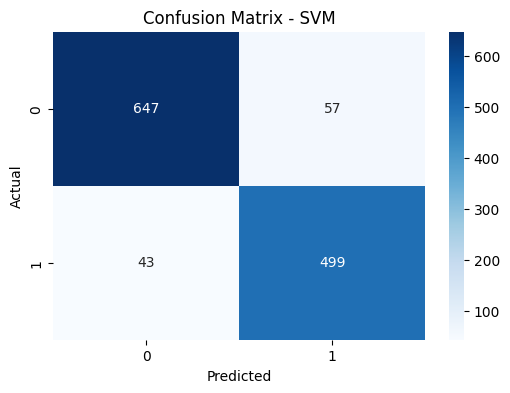


SVM Classification Report:
               precision    recall  f1-score   support

           0      0.938     0.919     0.928       704
           1      0.897     0.921     0.909       542

    accuracy                          0.920      1246
   macro avg      0.918     0.920     0.919      1246
weighted avg      0.920     0.920     0.920      1246

Accuracy: 0.9197


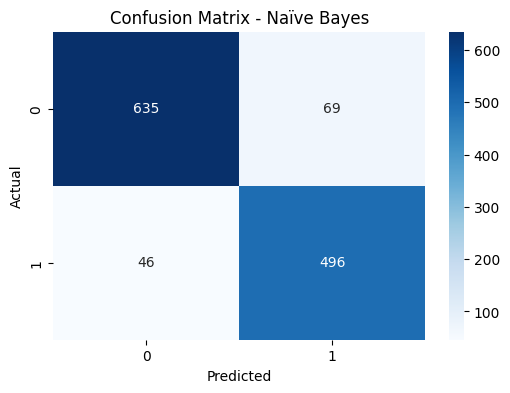


Naïve Bayes Classification Report:
               precision    recall  f1-score   support

           0      0.932     0.902     0.917       704
           1      0.878     0.915     0.896       542

    accuracy                          0.908      1246
   macro avg      0.905     0.909     0.907      1246
weighted avg      0.909     0.908     0.908      1246

Accuracy: 0.9077


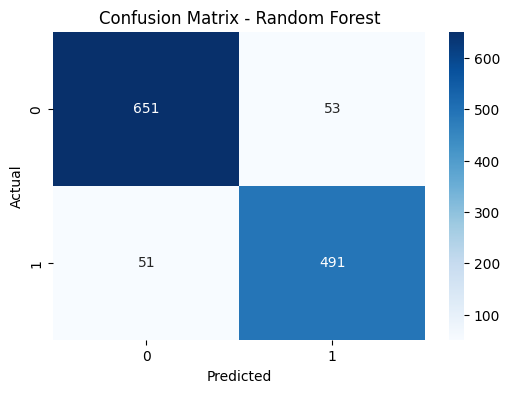


Random Forest Classification Report:
               precision    recall  f1-score   support

           0      0.927     0.925     0.926       704
           1      0.903     0.906     0.904       542

    accuracy                          0.917      1246
   macro avg      0.915     0.915     0.915      1246
weighted avg      0.917     0.917     0.917      1246

Accuracy: 0.9165


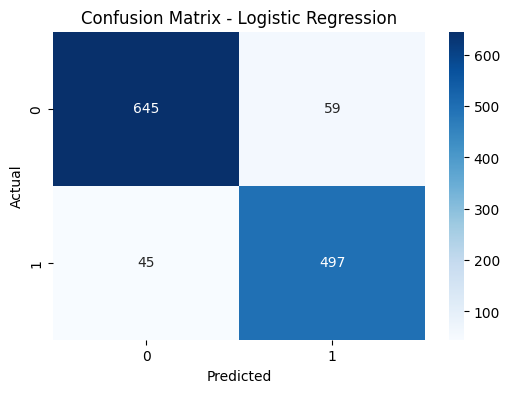


Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0      0.935     0.916     0.925       704
           1      0.894     0.917     0.905       542

    accuracy                          0.917      1246
   macro avg      0.914     0.917     0.915      1246
weighted avg      0.917     0.917     0.917      1246

Accuracy: 0.9165


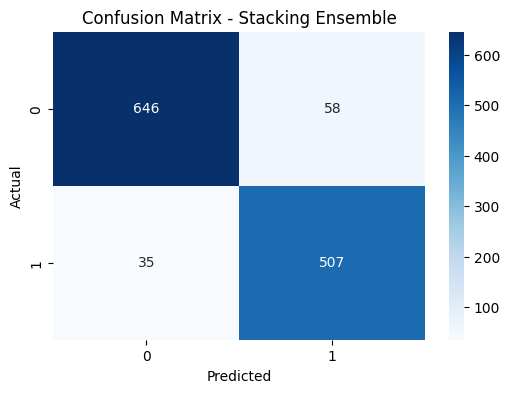


Stacking Ensemble Classification Report:
               precision    recall  f1-score   support

           0      0.949     0.918     0.933       704
           1      0.897     0.935     0.916       542

    accuracy                          0.925      1246
   macro avg      0.923     0.927     0.924      1246
weighted avg      0.926     0.925     0.926      1246

Stacking Ensemble Accuracy: 0.9254


In [ ]:
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Inisialisasi Base Learners (Tidak Dilatih Dulu!)
svm_clf = SVC(kernel='rbf', probability=True, random_state=42)
nb_clf = MultinomialNB()
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
lr_clf = LogisticRegression(random_state=42)

# Evaluasi Model Individu
models = {
    'SVM': svm_clf,
    'Naïve Bayes': nb_clf,
    'Random Forest': rf_clf,
    'Logistic Regression': lr_clf
}

def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(title)
    plt.show()

# Latih dan Evaluasi Model Individu
for name, model in models.items():
    model.fit(X_train, Y_train)
    Y_pred = model.predict(X_test)
    plot_confusion_matrix(Y_test, Y_pred, f'Confusion Matrix - {name}')
    print(f'\n{name} Classification Report:\n', classification_report(Y_test, Y_pred, digits=3))
    print(f'Accuracy: {accuracy_score(Y_test, Y_pred):.4f}')

# **Stacking Ensemble (Gunakan Model Baru, Tidak dari Training Sebelumnya!)**
base_learners = [
    ('svm', SVC(kernel='rbf', probability=True, random_state=42, class_weight="balanced")),
    ('naive_bayes', MultinomialNB()),
    ('random_forest', RandomForestClassifier(n_estimators=100, random_state=42, class_weight="balanced"))
]
meta_learner = LogisticRegression(random_state=42, class_weight="balanced")

stacking_clf_sen_transaksi = StackingClassifier(estimators=base_learners, final_estimator=meta_learner, passthrough=False, cv=5)

# Latih dan Evaluasi Stacking
stacking_clf_sen_transaksi.fit(X_train, Y_train)
Y_pred_stack = stacking_clf_sen_transaksi.predict(X_test)

plot_confusion_matrix(Y_test, Y_pred_stack, 'Confusion Matrix - Stacking Ensemble')
print('\nStacking Ensemble Classification Report:\n', classification_report(Y_test, Y_pred_stack, digits=3))
print(f'Stacking Ensemble Accuracy: {accuracy_score(Y_test, Y_pred_stack):.4f}')

**SMOTE SENTIMEN TRANSAKSI**

In [ ]:
from imblearn.over_sampling import SMOTE
import numpy as np


from sklearn.model_selection import train_test_split

# Menampilkan jumlah data sebelum SMOTE
unique, counts = np.unique(Y_train, return_counts=True)
print("Jumlah data sebelum SMOTE:")
for cls, count in zip(unique, counts):
    print(f'Kelas {cls}: {count}')

# Menyeimbangkan Data dengan SMOTE
smote = SMOTE(random_state=42)
X_train_resampled, Y_train_resampled = smote.fit_resample(X_train, Y_train)

# Menampilkan jumlah data setelah SMOTE
unique_resampled, counts_resampled = np.unique(Y_train_resampled, return_counts=True)
print("\nJumlah data setelah SMOTE:")
for cls, count in zip(unique_resampled, counts_resampled):
    print(f'Kelas {cls}: {count}')

Jumlah data sebelum SMOTE:
Kelas 0: 2990
Kelas 1: 1994

Jumlah data setelah SMOTE:
Kelas 0: 2990
Kelas 1: 2990


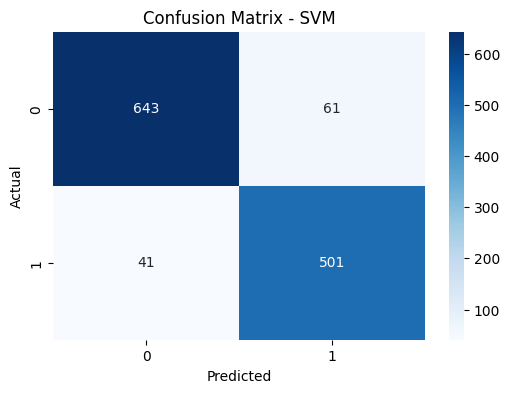


SVM Classification Report:
               precision    recall  f1-score   support

           0      0.940     0.913     0.927       704
           1      0.891     0.924     0.908       542

    accuracy                          0.918      1246
   macro avg      0.916     0.919     0.917      1246
weighted avg      0.919     0.918     0.918      1246

Accuracy: 0.9181


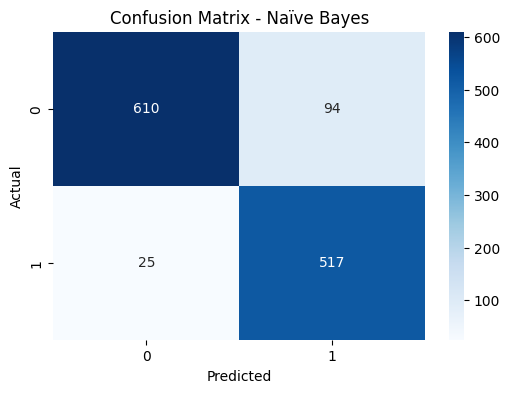


Naïve Bayes Classification Report:
               precision    recall  f1-score   support

           0      0.961     0.866     0.911       704
           1      0.846     0.954     0.897       542

    accuracy                          0.904      1246
   macro avg      0.903     0.910     0.904      1246
weighted avg      0.911     0.904     0.905      1246

Accuracy: 0.9045


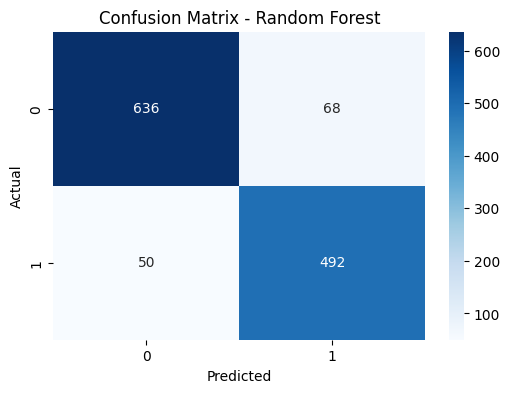


Random Forest Classification Report:
               precision    recall  f1-score   support

           0      0.927     0.903     0.915       704
           1      0.879     0.908     0.893       542

    accuracy                          0.905      1246
   macro avg      0.903     0.906     0.904      1246
weighted avg      0.906     0.905     0.905      1246

Accuracy: 0.9053


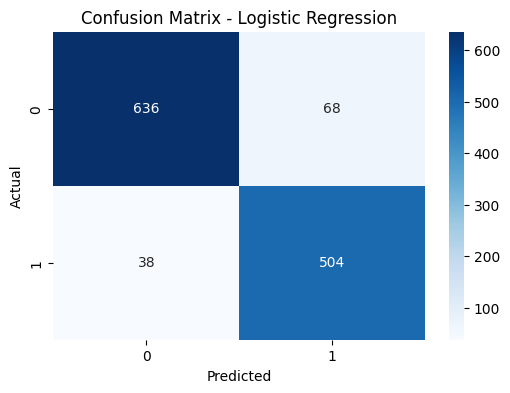


Logistic Regression Classification Report:
               precision    recall  f1-score   support

           0      0.944     0.903     0.923       704
           1      0.881     0.930     0.905       542

    accuracy                          0.915      1246
   macro avg      0.912     0.917     0.914      1246
weighted avg      0.916     0.915     0.915      1246

Accuracy: 0.9149


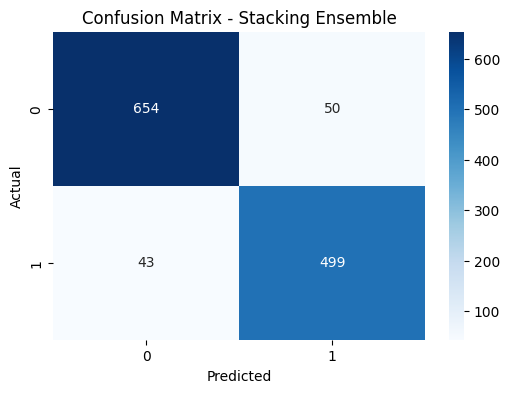


Stacking Ensemble Classification Report:
               precision    recall  f1-score   support

           0      0.938     0.929     0.934       704
           1      0.909     0.921     0.915       542

    accuracy                          0.925      1246
   macro avg      0.924     0.925     0.924      1246
weighted avg      0.926     0.925     0.925      1246

Stacking Ensemble Accuracy: 0.9254


In [ ]:
from sklearn.svm import SVC
from sklearn.naive_bayes import MultinomialNB
from sklearn.ensemble import RandomForestClassifier, StackingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score, classification_report, confusion_matrix
import seaborn as sns
import matplotlib.pyplot as plt

# Inisialisasi Base Learners (Tidak Dilatih Dulu!)
svm_clf = SVC(kernel='rbf', probability=True, random_state=42)
nb_clf = MultinomialNB()
rf_clf = RandomForestClassifier(n_estimators=100, random_state=42)
lr_clf = LogisticRegression(random_state=42)

# Evaluasi Model Individu
models = {
    'SVM': svm_clf,
    'Naïve Bayes': nb_clf,
    'Random Forest': rf_clf,
    'Logistic Regression': lr_clf
}

def plot_confusion_matrix(y_true, y_pred, title):
    cm = confusion_matrix(y_true, y_pred)
    plt.figure(figsize=(6, 4))
    sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')
    plt.xlabel('Predicted')
    plt.ylabel('Actual')
    plt.title(title)
    plt.show()

# Latih dan Evaluasi Model Individu
for name, model in models.items():
    model.fit(X_train_resampled, Y_train_resampled)
    Y_pred = model.predict(X_test)
    plot_confusion_matrix(Y_test, Y_pred, f'Confusion Matrix - {name}')
    print(f'\n{name} Classification Report:\n', classification_report(Y_test, Y_pred, digits=3))
    print(f'Accuracy: {accuracy_score(Y_test, Y_pred):.4f}')

# **Stacking Ensemble (Gunakan Model Baru, Tidak dari Training Sebelumnya!)**
base_learners = [
    ('svm', SVC(kernel='rbf', probability=True, random_state=42)),
    ('naive_bayes', MultinomialNB()),
    ('random_forest', RandomForestClassifier(n_estimators=100, random_state=42))
]
meta_learner = LogisticRegression(random_state=42, class_weight="balanced")

stacking_clf = StackingClassifier(estimators=base_learners, final_estimator=meta_learner, passthrough=False, cv=5)

# Latih dan Evaluasi Stacking
stacking_clf.fit(X_train_resampled, Y_train_resampled)
Y_pred_stack = stacking_clf.predict(X_test)

plot_confusion_matrix(Y_test, Y_pred_stack, 'Confusion Matrix - Stacking Ensemble')
print('\nStacking Ensemble Classification Report:\n', classification_report(Y_test, Y_pred_stack, digits=3))
print(f'Stacking Ensemble Accuracy: {accuracy_score(Y_test, Y_pred_stack):.4f}')

**EXPORT**

In [ ]:
import pickle

# Simpan model dan vectorizer ke dalam file pickle
with open("model_aspek_tampilan.pkl", "wb") as file:
    pickle.dump({
        "vectorizer_tampilan": vectorizer_tampilan,
        "stacking_clf_tampilan": stacking_clf_tampilan
    }, file)

print("Model Stacking dan Vectorizer berhasil disimpan sebagai 'model_aspek_tampilan.pkl'")
from google.colab import files

files.download("model_aspek_tampilan.pkl")


Model Stacking dan Vectorizer berhasil disimpan sebagai 'model_aspek_tampilan.pkl'


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import pickle

# Simpan model dan vectorizer dalam dictionary
model_sen_tampilan = {
    "vectorizer_sen_tampilan": vectorizer_sen_tampilan,
    "stacking_clf_sen_tampilan": stacking_clf_sen_tampilan
}

# Simpan ke file pickle
with open("model_sentimen_tampilan.pkl", "wb") as file:
    pickle.dump(model_sen_tampilan, file)

print("Model berhasil disimpan!")

files.download("model_sentimen_tampilan.pkl")

Model berhasil disimpan!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import pickle

# Simpan ke dalam dictionary
model_autentikasi = {
    "vectorizer_autentikasi": vectorizer_autentikasi,
    "stacking_clf_autentikasi": stacking_clf_autentikasi
}

# Simpan ke file
with open("model_aspek_autentikasi.pkl", "wb") as file:
    pickle.dump(model_autentikasi, file)

print("Model berhasil disimpan!")

print("Model Stacking dan Vectorizer berhasil disimpan sebagai 'model_aspek_tampilan.pkl'")
from google.colab import files

files.download("model_aspek_autentikasi.pkl")


Model berhasil disimpan!
Model Stacking dan Vectorizer berhasil disimpan sebagai 'model_aspek_tampilan.pkl'


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import pickle

# Simpan model dan vectorizer dalam dictionary
model_sen_autentikasi = {
    "vectorizer_sen_autentikasi": vectorizer_sen_autentikasi,  # Pastikan variabel ini sudah diganti sesuai konteks
    "stacking_clf_sen_autentikasi": stacking_clf_sen_autentikasi  # Pastikan variabel ini sudah diganti sesuai konteks
}

# Simpan ke file pickle
with open("model_sentimen_autentikasi.pkl", "wb") as file:
    pickle.dump(model_sen_autentikasi, file)

print("Model berhasil disimpan!")

files.download("model_sentimen_autentikasi.pkl")


Model berhasil disimpan!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import pickle

# Simpan ke dalam dictionary
model_transaksi = {
    "vectorizer_transaksi": vectorizer_transaksi,
    "stacking_clf_transaksi": stacking_clf_transaksi
}

# Simpan ke file
with open("model_aspek_transaksi.pkl", "wb") as file:
    pickle.dump(model_transaksi, file)

print("Model berhasil disimpan!")

print("Model Stacking dan Vectorizer berhasil disimpan sebagai 'model_aspek_tampilan.pkl'")
from google.colab import files

files.download("model_aspek_transaksi.pkl")


Model berhasil disimpan!
Model Stacking dan Vectorizer berhasil disimpan sebagai 'model_aspek_tampilan.pkl'


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
import pickle

# Simpan model dan vectorizer dalam dictionary
model_sen_transaksi = {
    "vectorizer_sen_transaksi": vectorizer_sen_transaksi,  # Pastikan variabel ini sudah diganti sesuai konteks
    "stacking_clf_sen_transaksi": stacking_clf_sen_transaksi  # Pastikan variabel ini sudah diganti sesuai konteks
}

# Simpan ke file pickle
with open("model_sentimen_transaksi.pkl", "wb") as file:
    pickle.dump(model_sen_transaksi, file)

print("Model berhasil disimpan!")
from google.colab import files

files.download("model_sentimen_transaksi.pkl")


Model berhasil disimpan!


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

In [ ]:
from google.colab import files

files.download("model_sentimen_tampilan.pkl")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>

**INTERPRETASI MODEL**

In [ ]:
! pip install lime scikit-learn matplotlib



     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 275.7/275.7 kB 5.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
  Created wheel for lime: filename=lime-0.2.0.1-py3-none-any.whl size=283834 sha256=222f552dda7cfdf7b546b229d420e9705e9812aa58d114edf6a88acf19ce36ac
  Stored in directory: /root/.cache/pip/wheels/85/fa/a3/9c2d44c9f3cd77cf4e533b58900b2bf4487f2a17e8ec212a3d
Successfully built lime


**Interpretasi Model Aspek Tampilan**

In [ ]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from lime.lime_text import LimeTextExplainer
from sklearn.pipeline import make_pipeline

# Load preprocessing pipeline
with open("preprocessing_pipeline.pkl", "rb") as file:
    preprocessing_pipeline = pickle.load(file)

# Load model dari file pickle
with open("model_aspek_tampilan.pkl", "rb") as file:
    model_data = pickle.load(file)

# Pastikan model dan vectorizer tersedia
vectorizer_tampilan = model_data["vectorizer_tampilan"]
stacking_clf_tampilan = model_data["stacking_clf_tampilan"]

# Buat pipeline agar LIME dapat bekerja dengan model
pipeline_stacking = make_pipeline(vectorizer_tampilan, stacking_clf_tampilan)

# Inisialisasi LIME Explainer
explainer = LimeTextExplainer(class_names=["Tampilan", "Non Tampilan"])

# Input ulasan untuk dijelaskan
text_to_explain = "aplikasinya bagus, tampilannya juga sangat keren. Untuk fitur juga banyak dan gampang dipakai. Worth it banget deh untuk mempermudah semua transaksi. Tampilan warnanya ga monoton bikin hati seneng liatnya. Mantep dehh"

# Terapkan preprocessing sebelum prediksi
processed_text = preprocessing_pipeline.transform(text_to_explain)

# Interpretasi dengan LIME
exp = explainer.explain_instance(processed_text, pipeline_stacking.predict_proba, num_features=5)

# Visualisasi hasil interpretasi
exp.show_in_notebook(text=True)


**Interpretasi Model Aspek Autentikasi**

In [ ]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from lime.lime_text import LimeTextExplainer
from sklearn.pipeline import make_pipeline

# Load preprocessing pipeline
with open("preprocessing_pipeline.pkl", "rb") as file:
    preprocessing_pipeline = pickle.load(file)

# Load model autentikasi dari file pickle
with open("/content/model_aspek_autentikasi.pkl", "rb") as file:
    model_data = pickle.load(file)

# Pastikan model dan vectorizer tersedia
vectorizer_autentikasi = model_data["vectorizer_autentikasi"]
stacking_clf_autentikasi = model_data["stacking_clf_autentikasi"]

# Buat pipeline agar LIME dapat bekerja dengan model
pipeline_stacking = make_pipeline(vectorizer_autentikasi, stacking_clf_autentikasi)

# Inisialisasi LIME Explainer
explainer = LimeTextExplainer(class_names=["Autentikasi", "Non Autentikasi"])

# Input ulasan untuk dijelaskan
text_to_explain = "Saat login ke aplikasi sering gagal dan harus memasukkan kode OTP berkali kali."

# Terapkan preprocessing sebelum prediksi
processed_text = preprocessing_pipeline.transform(text_to_explain)

# Interpretasi dengan LIME
exp = explainer.explain_instance(processed_text, pipeline_stacking.predict_proba, num_features=5)

# Visualisasi hasil interpretasi
exp.show_in_notebook(text=True)


**Interpretasi Model Aspek Transaksi**

In [ ]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from lime.lime_text import LimeTextExplainer
from sklearn.pipeline import make_pipeline

# Load preprocessing pipeline
with open("preprocessing_pipeline.pkl", "rb") as file:
    preprocessing_pipeline = pickle.load(file)

# Load model transaksi dari file pickle
with open("/content/model_aspek_transaksi.pkl", "rb") as file:
    model_data = pickle.load(file)

# Pastikan model dan vectorizer tersedia
vectorizer_transaksi = model_data["vectorizer_transaksi"]
stacking_clf_transaksi = model_data["stacking_clf_transaksi"]

# Buat pipeline agar LIME dapat bekerja dengan model
pipeline_stacking = make_pipeline(vectorizer_transaksi, stacking_clf_transaksi)

# Inisialisasi LIME Explainer
explainer = LimeTextExplainer(class_names=["Transaksi", "Non Transaksi"])

# Input ulasan untuk dijelaskan
text_to_explain = "tampilan sudah bagus namun kemarin Saya melakukan transfer ke bank lain tetapi saldo sudah terpotong dan uang belum masuk."

# Terapkan preprocessing sebelum prediksi
processed_text = preprocessing_pipeline.transform(text_to_explain)

# Interpretasi dengan LIME
exp = explainer.explain_instance(processed_text, pipeline_stacking.predict_proba, num_features=5)

# Visualisasi hasil interpretasi
exp.show_in_notebook(text=True)


**Interpretasi Model Sentimen Tampilan**

In [ ]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from lime.lime_text import LimeTextExplainer
from sklearn.pipeline import make_pipeline
import joblib

# Load preprocessing function
preprocessing_pipeline = joblib.load("preprocessing.pkl")

# Load model dari file pickle
with open("model_sentimen_tampilan.pkl", "rb") as file:
    model_data = pickle.load(file)

# Pastikan model dan vectorizer tersedia
vectorizer_sen_tampilan = model_data["vectorizer_sen_tampilan"]
stacking_clf_sen_tampilan = model_data["stacking_clf_sen_tampilan"]

# Buat pipeline agar LIME dapat bekerja dengan model
pipeline_stacking = make_pipeline(vectorizer_sen_tampilan, stacking_clf_sen_tampilan)

# Inisialisasi LIME Explainer
explainer = LimeTextExplainer(class_names=["Positive", "Negative"])

# Input ulasan untuk dijelaskan
text_to_explain = "Tampilan lebih menarik. Lebih mudah dipahami menu menu nya. Lebih simple langkah langkah transaksinya."

# Terapkan preprocessing sebelum prediksi
processed_text = preprocessing_pipeline(text_to_explain)

# Interpretasi dengan LIME
exp = explainer.explain_instance(processed_text, pipeline_stacking.predict_proba, num_features=5)

# Visualisasi hasil interpretasi
exp.show_in_notebook(text=True)


**Interpretasi Model Sentimen Autentikasi**

In [ ]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from lime.lime_text import LimeTextExplainer
from sklearn.pipeline import make_pipeline
import joblib

# Load preprocessing function
preprocessing_pipeline = joblib.load("preprocessing.pkl")

# Load model dari file pickle
with open("model_sentimen_autentikasi.pkl", "rb") as file:
    model_data = pickle.load(file)

# Pastikan model dan vectorizer tersedia
vectorizer_sen_tampilan = model_data["vectorizer_sen_autentikasi"]
stacking_clf_sen_tampilan = model_data["stacking_clf_sen_autentikasi"]

# Buat pipeline agar LIME dapat bekerja dengan model
pipeline_stacking = make_pipeline(vectorizer_sen_tampilan, stacking_clf_sen_tampilan)

# Inisialisasi LIME Explainer
explainer = LimeTextExplainer(class_names=["Positive", "Negative"])

# Input ulasan untuk dijelaskan
text_to_explain = "Aplikasi Bank yang paling buruk, sering error, sering minta verifikasi wajah, namun sensor wajah dari aplikasi ini sangat buruk jadinya verifikasi wajah pun gagal dan HARUS DIULANG KEESOKAN HARINYA ! Tampilan menu didalamnya ribet dan rumit. Pengalaman paling buruk menggunakan aplikasi Bank BNI ini !!"

# Terapkan preprocessing sebelum prediksi
processed_text = preprocessing_pipeline(text_to_explain)

# Interpretasi dengan LIME
exp = explainer.explain_instance(processed_text, pipeline_stacking.predict_proba, num_features=5)

# Visualisasi hasil interpretasi
exp.show_in_notebook(text=True)


**Interpretasi Model Sentimen Transaksi**

In [ ]:
import pickle
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
from lime.lime_text import LimeTextExplainer
from sklearn.pipeline import make_pipeline
import joblib

# Load preprocessing function
preprocessing_pipeline = joblib.load("preprocessing.pkl")

# Load model dari file pickle
with open("model_sentimen_transaksi.pkl", "rb") as file:
    model_data = pickle.load(file)

# Pastikan model dan vectorizer tersedia
vectorizer_sen_transaksi = model_data["vectorizer_sen_transaksi"]
stacking_clf_sen_transaksi = model_data["stacking_clf_sen_transaksi"]

# Buat pipeline agar LIME dapat bekerja dengan model
pipeline_stacking = make_pipeline(vectorizer_sen_transaksi, stacking_clf_sen_transaksi)

# Inisialisasi LIME Explainer
explainer = LimeTextExplainer(class_names=["Positive", "Negative"])

# Input ulasan untuk dijelaskan
text_to_explain = "Saya melakukan transaksi melalui Qris.transaksi gagal tapi saldo terpotong gimana ini"

# Terapkan preprocessing sebelum prediksi
processed_text = preprocessing_pipeline(text_to_explain)

# Interpretasi dengan LIME
exp = explainer.explain_instance(processed_text, pipeline_stacking.predict_proba, num_features=5)

# Visualisasi hasil interpretasi
exp.show_in_notebook(text=True)

In [ ]:
proba = pipeline_stacking.predict_proba([processed_text])
print(proba)


[[0.88853751 0.11146249]]


In [ ]:
import re
import joblib
import pandas as pd
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import word_tokenize
from Sastrawi.Stemmer.StemmerFactory import StemmerFactory

nltk.download('stopwords')
nltk.download('punkt')

# Load kamus kata baku
kamus_baku = pd.read_excel("/content/kamuskatabaku.xlsx")
kata_baru_df = pd.read_csv("/content/normalisasinew - Sheet1.csv")

baku_dict = dict(zip(kamus_baku['tidak_baku'], kamus_baku['kata_baku']))
kata_baru_dict = dict(zip(kata_baru_df['tidak_baku'], kata_baru_df['kata_baku']))
baku_dict.update(kata_baru_dict)

# Stopwords
stop = stopwords.words('indonesian')
words_to_keep = ['kurang', 'tidak', 'masih', 'belum', 'baik', 'sangat', 'lama', 'sering', 'tanpa', 'enggak', 'lebih', 'bisa']
words_to_remove = ['nya', 'ya', 'by', 'aplikasi', 'aplikasinya', 'wondr', 'bni']
for word in words_to_keep:
    if word in stop:
        stop.remove(word)
stop.extend(words_to_remove)

# Stemming
factory = StemmerFactory()
stemmer = factory.create_stemmer()
exception_words = {"perbaikan", "diperbaiki", "tampilan", "layanan", "menarik", "gangguan"}

def preprocess_text(text):
    if pd.isna(text):  # Handle NaN
        return ""

    # 1. Clean Text (Hapus karakter non-ASCII, angka, tanda baca)
    text = re.sub(r'[^\x00-\x7F]+', '', text)
    text = re.sub(r'([a-zA-Z0-9])[\.\,\-;:\!]+([a-zA-Z])', r'\1 \2', text)
    text = re.sub(r'[^a-zA-Z\s]', '', text)

    # 2. Case Folding
    text = text.lower()

    # 3. Normalisasi
    text = ' '.join([baku_dict.get(word, word) for word in text.split()])

    # 4. Stopword Removal
    text = ' '.join([word for word in text.split() if word not in stop])

    # 5. Tokenisasi
    tokens = word_tokenize(text)

    # 6. Stemming dengan pengecualian
    stemmed_tokens = [token if token in exception_words else stemmer.stem(token) for token in tokens]

    return ' '.join(stemmed_tokens)

# Simpan fungsi sebagai pickle
joblib.dump(preprocess_text, "preprocessing.pkl")


[nltk_data] Downloading package stopwords to /root/nltk_data...
[nltk_data]   Package stopwords is already up-to-date!
[nltk_data] Downloading package punkt to /root/nltk_data...
[nltk_data]   Package punkt is already up-to-date!


['preprocessing.pkl']

In [ ]:
from google.colab import files
files.download("preprocessing.pkl")


<IPython.core.display.Javascript object>

<IPython.core.display.Javascript object>